# Import Libraries

In [1]:
import os
import sys
import time
import random
import json
import csv
import shutil
import re        
import warnings
from pathlib import Path
warnings.filterwarnings('ignore')


from sklearn.preprocessing import label_binarize
from sklearn.metrics import (
    confusion_matrix, classification_report, precision_score, recall_score, f1_score,
    roc_curve, auc, precision_recall_curve, average_precision_score, roc_auc_score
)
from sklearn.manifold import TSNE
import umap  

# Core Libraries
import numpy as np
import pandas as pd

# Progress Bars & Tables
from tqdm import tqdm
from tabulate import tabulate

# Image Processing
from PIL import Image
import cv2
from skimage.io import imread
from skimage import filters
from skimage.color import rgb2hsv
from skimage.feature import canny

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

# Feature Extraction / Statistics
from scipy.stats import entropy
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# ML / Evaluation
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import (
    precision_score, recall_score, f1_score, roc_auc_score,
    confusion_matrix, classification_report
)

# Deep Learning (TensorFlow/Keras)
import tensorflow as tf
from tensorflow.keras import Model, Input ,regularizers
from tensorflow.keras.optimizers import Adam,Nadam,SGD,RMSprop,Adagrad,Adadelta,Adamax
from tensorflow.keras.layers import (
    GlobalAveragePooling2D, Dense, Dropout, Concatenate
)
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, CSVLogger, ModelCheckpoint
from tensorflow.keras.optimizers import Nadam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, applications, models,Model, Input
from tensorflow.keras import backend as K


# CNN Backbones
from tensorflow.keras.applications import MobileNet, DenseNet121
from tensorflow.keras.regularizers import l2


print("All Library Imported Successfully....")


All Library Imported Successfully....


# Dataset Directory

In [2]:
datasets = {
    "Imbalanced_Data001": {
        "name": "Imbalanced_Data001",
        "train": r"E:\Data001\ImBalanced_Split\train",
        "test":  r"E:\Data001\ImBalanced_Split\test",
        "output": r"E:\models\Imbalanced_Data001",
        "class_names": ["Glioma", "Meningioma", "Pituitary"],
        "num_classes": 3
    },
    "Balanced_Data001": {
        "name": "Balanced_Data001",
        "train": r"E:\Data001\Balanced_Split\train",
        "test":  r"E:\Data001\Balanced_Split\test",
        "output": r"E:\models\Balanced_Data001",
        "class_names": ["Glioma", "Meningioma", "Pituitary"],
        "num_classes": 3
    }
}


# Ploting and EDA

In [3]:
plt.rcParams['figure.figsize'] = (10, 8)
plt.rcParams['figure.dpi'] = 150
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.titleweight'] = 'bold'


def new_fig(title=""):

    fig = plt.figure(figsize=(10, 8), dpi=150)
    if title:
        plt.suptitle(title, fontsize=18, fontweight='bold', y=0.98)
    return fig

def new_fig_1x2(title=""):
    
    fig, axs = plt.subplots(1, 2, figsize=(10, 8), dpi=150)
    if title:
        plt.suptitle(title, fontsize=18, fontweight='bold', y=0.98)
    fig.tight_layout(pad=3.0)
    return fig, axs

def new_fig_1x3(title=""):
    
    fig, axs = plt.subplots(1, 3, figsize=(10, 8), dpi=150)
    if title:
        plt.suptitle(title, fontsize=18, fontweight='bold', y=0.98)
    fig.tight_layout(pad=3.0)
    return fig, axs

def new_fig_1x4(title=""):
    
    fig, axs = plt.subplots(1, 4, figsize=(10, 8), dpi=150)
    if title:
        plt.suptitle(title, fontsize=18, fontweight='bold', y=0.98)
    fig.tight_layout(pad=3.0)
    return fig, axs


Processing Imbalanced_Data001


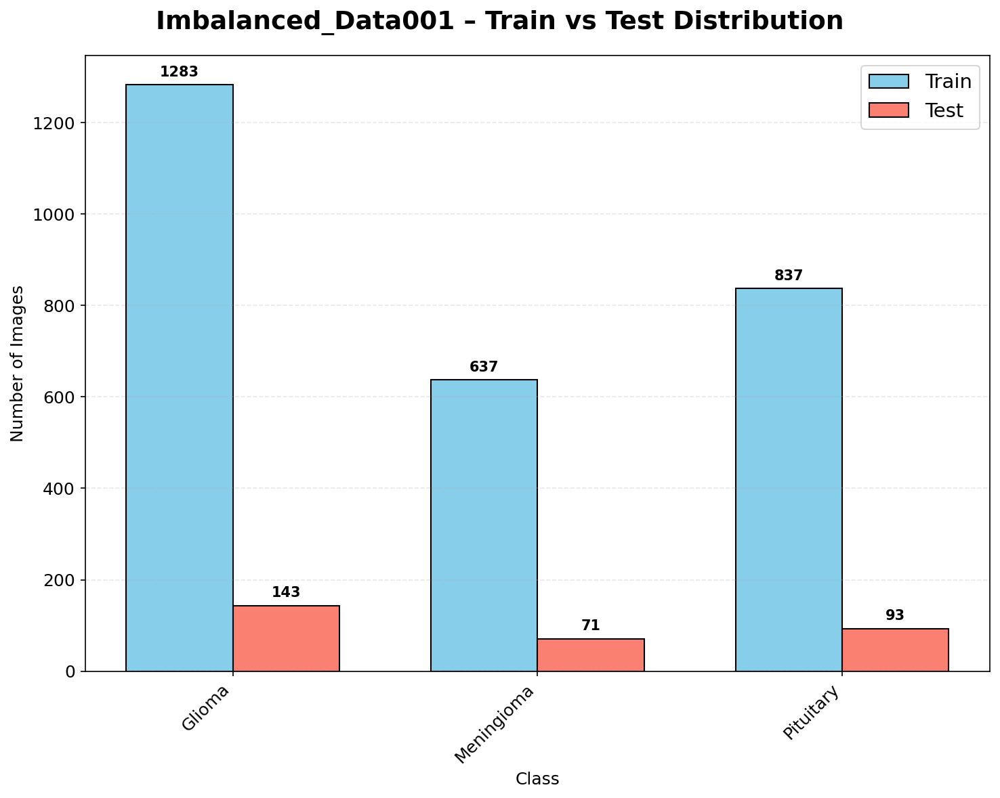


Processing Balanced_Data001


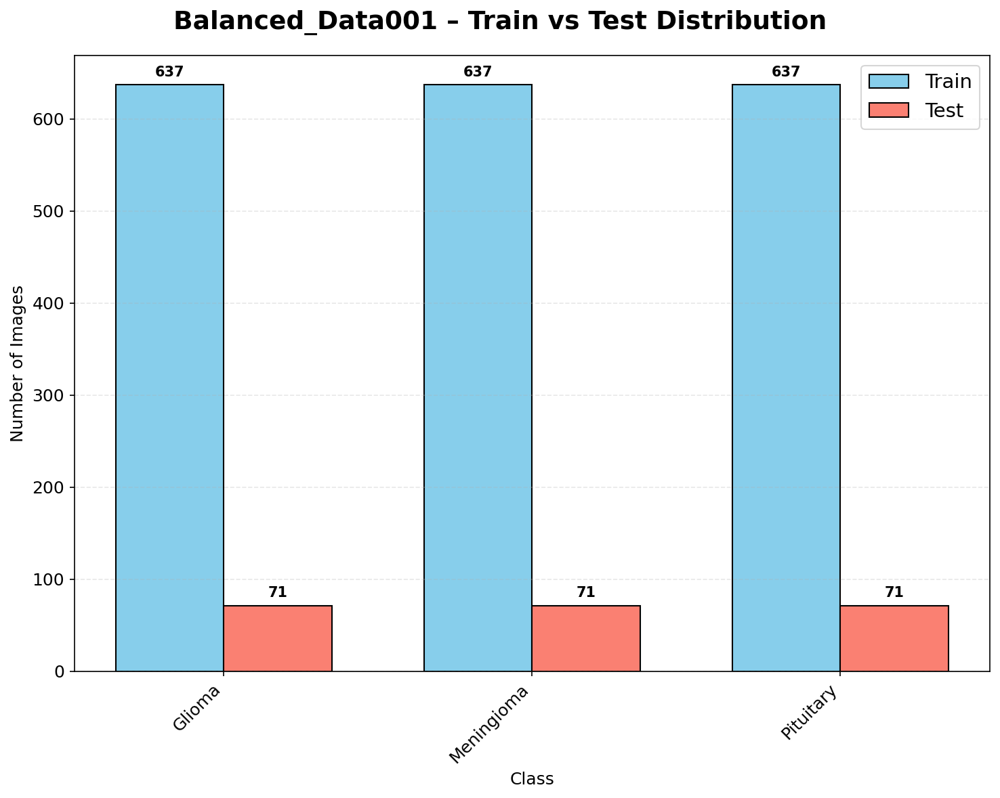


Dataset Summary Table


,Dataset,Train_Images,Test_Images,Total_Images,Num_Classes,Imbalance_Ratio
0,Imbalanced_Data001,2757,307,3064,3,2.01
1,Balanced_Data001,1911,213,2124,3,1.00



Image Statistics (from train split)

→ Imbalanced_Data001
  Images_Sampled      : 900
  Mean_Width          : 511.4
  Std_Width           : 12.1
  Mean_Height         : 511.4
  Std_Height          : 12.1
  Mean_Aspect_Ratio   : 1.0
  Std_Aspect_Ratio    : 0.0
  Mean_RGB            : [40.48, 40.48, 40.48]
  Std_RGB             : [41.66, 41.66, 41.66]

→ Balanced_Data001
  Images_Sampled      : 900
  Mean_Width          : 511.1
  Std_Width           : 14.8
  Mean_Height         : 511.1
  Std_Height          : 14.8
  Mean_Aspect_Ratio   : 1.0
  Std_Aspect_Ratio    : 0.0
  Mean_RGB            : [40.37, 40.37, 40.37]
  Std_RGB             : [41.76, 41.76, 41.76]

One Image Per Class


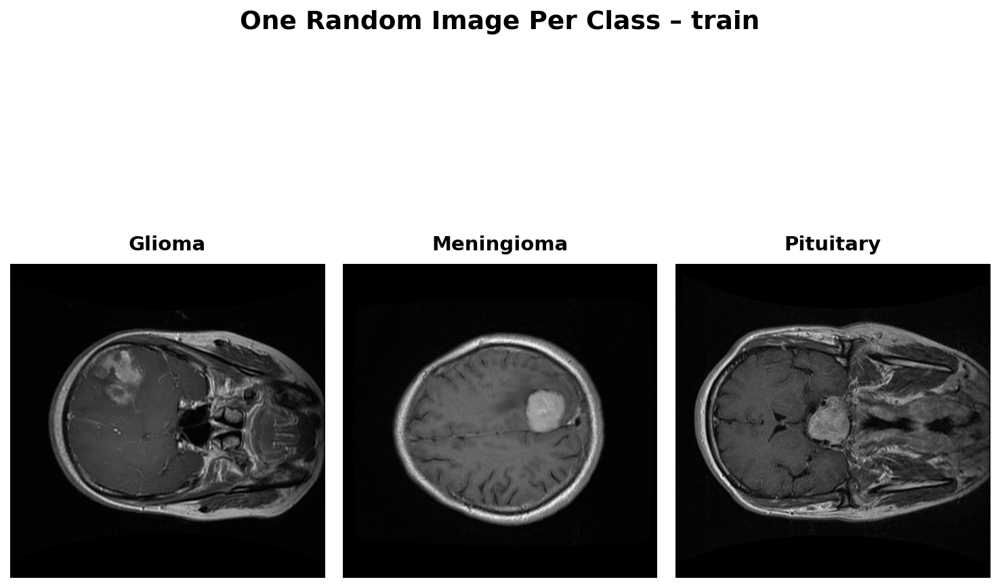

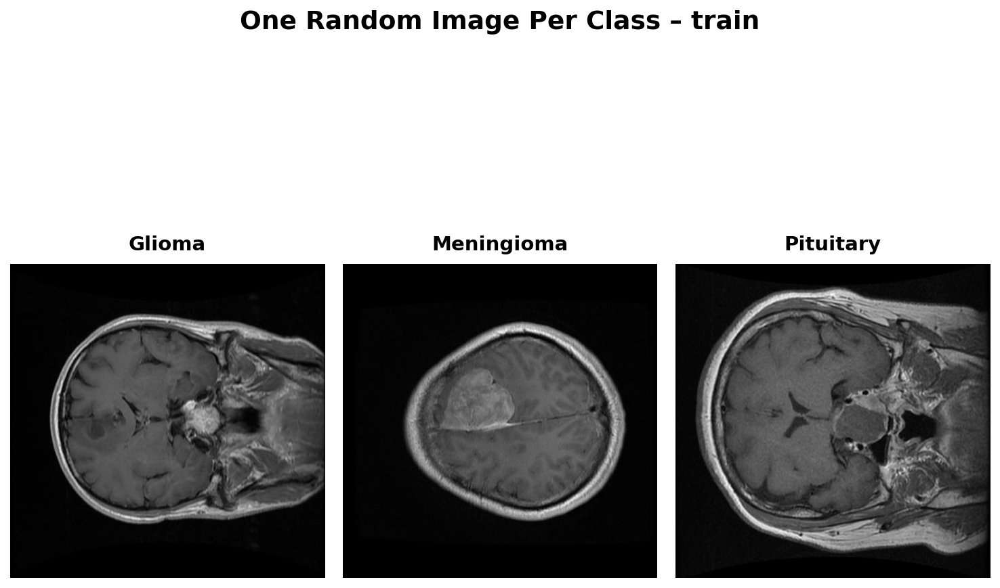

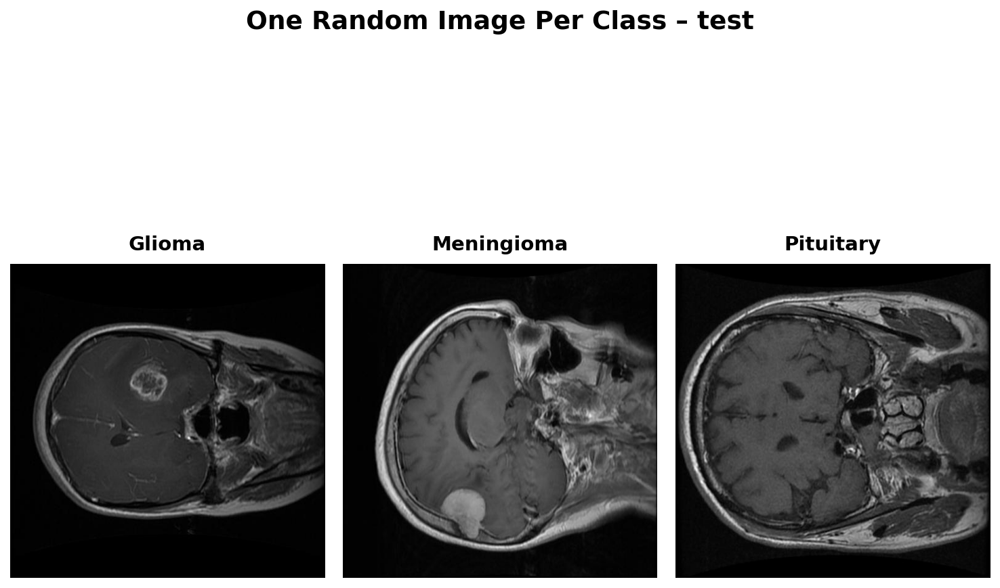

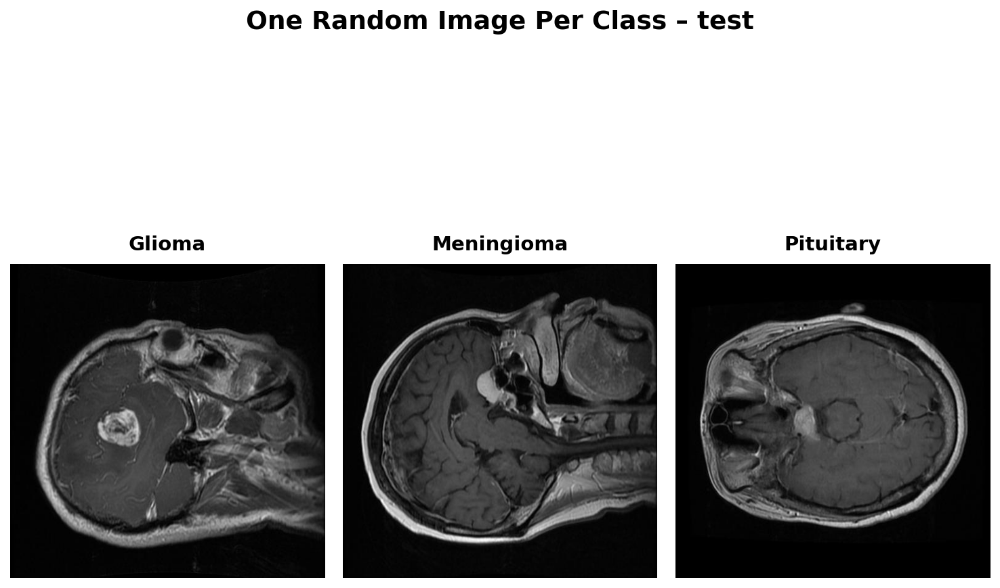


EDA Completed Successfully.


In [4]:
def get_all_classes(root_path: str):
    root = Path(root_path)
    if not root.exists():
        raise FileNotFoundError(f"Path not found: {root}")
    return sorted([d.name for d in root.iterdir() if d.is_dir()])

def get_class_distribution(directory):
    counts = {}
    for cls in get_all_classes(directory):
        path = Path(directory) / cls
        counts[cls] = len([f for f in path.iterdir() 
                          if f.suffix.lower() in {'.png', '.jpg', '.jpeg'}])
    return counts

def plot_train_test_bars(train_counts, test_counts, dataset_name):
    classes = sorted(set(train_counts.keys()) | set(test_counts.keys()))
    train_vals = [train_counts.get(c, 0) for c in classes]
    test_vals  = [test_counts.get(c, 0)  for c in classes]

    x = np.arange(len(classes))
    width = 0.35

    new_fig(f"{dataset_name} – Train vs Test Distribution")
    plt.bar(x - width/2, train_vals, width, label='Train', color='skyblue', edgecolor='black')
    plt.bar(x + width/2, test_vals,  width, label='Test',  color='salmon',  edgecolor='black')

    plt.xlabel("Class")
    plt.ylabel("Number of Images")
    plt.xticks(x, classes, rotation=45, ha='right')
    plt.legend(fontsize=14)
    plt.grid(axis='y', alpha=0.3, linestyle='--')

    max_y = max(train_vals + test_vals, default=1)
    for i, (t, s) in enumerate(zip(train_vals, test_vals)):
        if t > 0:
            plt.text(i - width/2, t + max_y*0.01, str(t), ha='center', va='bottom', fontsize=10, fontweight='bold')
        if s > 0:
            plt.text(i + width/2, s + max_y*0.01, str(s), ha='center', va='bottom', fontsize=10, fontweight='bold')

    plt.tight_layout()
    plt.show()

def compute_image_stats(directory, sample_size=200):
    widths, heights, aspect_ratios = [], [], []
    means_rgb, stds_rgb = [], []

    for cls in get_all_classes(directory):
        cls_path = Path(directory) / cls
        img_files = [f for f in cls_path.iterdir()
                     if f.suffix.lower() in {'.png', '.jpg', '.jpeg'}]
        random.shuffle(img_files)
        for img_path in img_files[:sample_size]:
            img = cv2.imread(str(img_path))
            if img is None: continue
            h, w = img.shape[:2]
            widths.append(w)
            heights.append(h)
            aspect_ratios.append(w / h if h > 0 else 0)
            means_rgb.append(img.mean(axis=(0,1)))
            stds_rgb.append(img.std(axis=(0,1)))

    if not widths:
        return {"error": "No valid images found."}

    return {
        "Images_Sampled": len(widths),
        "Mean_Width": round(float(np.mean(widths)), 1),
        "Std_Width": round(float(np.std(widths)), 1),
        "Mean_Height": round(float(np.mean(heights)), 1),
        "Std_Height": round(float(np.std(heights)), 1),
        "Mean_Aspect_Ratio": round(float(np.mean(aspect_ratios)), 3),
        "Std_Aspect_Ratio": round(float(np.std(aspect_ratios)), 3),
        "Mean_RGB": [round(x, 2) for x in np.mean(means_rgb, axis=0).tolist()],
        "Std_RGB": [round(x, 2) for x in np.mean(stds_rgb, axis=0).tolist()]
    }

def show_one_image_per_class(directory):
    classes = get_all_classes(directory)
    n = len(classes)
    if n == 0: 
        print("No classes found.")
        return

    new_fig(f"One Random Image Per Class – {Path(directory).name}")
    for i, cls in enumerate(classes, 1):
        cls_path = Path(directory) / cls
        img_files = list(cls_path.glob("*.png")) + list(cls_path.glob("*.jpg")) + list(cls_path.glob("*.jpeg"))
        if not img_files:
            continue
        img_file = random.choice(img_files)
        img = cv2.imread(str(img_file))[:, :, ::-1]

        plt.subplot(1, n, i)
        plt.imshow(img)
        plt.title(cls, fontsize=14, fontweight='bold', pad=10)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# -----------------------------
# MAIN EXECUTION
# -----------------------------

summary_rows = []

for name, paths in datasets.items():
    print(f"\nProcessing {name}")

    train_dist = get_class_distribution(paths["train"])
    test_dist  = get_class_distribution(paths["test"])

    plot_train_test_bars(train_dist, test_dist, name)

    total_train = sum(train_dist.values())
    total_test  = sum(test_dist.values())
    imbalance_ratio = max(train_dist.values()) / (min(train_dist.values()) + 1e-8) if train_dist else 1

    summary_rows.append({
        "Dataset": name,
        "Train_Images": total_train,
        "Test_Images": total_test,
        "Total_Images": total_train + total_test,
        "Num_Classes": len(train_dist),
        "Imbalance_Ratio": round(imbalance_ratio, 2)
    })

# Summary Table
summary_df = pd.DataFrame(summary_rows)
print("\nDataset Summary Table")
display(summary_df)

# Image Statistics
print("\nImage Statistics (from train split)")
for name, paths in datasets.items():
    print(f"\n→ {name}")
    stats = compute_image_stats(paths["train"], sample_size=300)
    for k, v in stats.items():
        print(f"  {k:20}: {v}")

# Visual Samples
print("\nOne Image Per Class")
show_one_image_per_class(datasets["Imbalanced_Data001"]["train"])
show_one_image_per_class(datasets["Balanced_Data001"]["train"])
show_one_image_per_class(datasets["Imbalanced_Data001"]["test"])
show_one_image_per_class(datasets["Balanced_Data001"]["test"])
print("\nEDA Completed Successfully.")


════════════════════════════════════════════════════════════════════════════════════════════════
███████████████████████████████  EXPLORING: Imbalanced_Data001  ████████████████████████████████
════════════════════════════════════════════════════════════════════════════════════════════════


=== Imbalanced_Data001 – File Metadata Sample ===


,class,file,size_kb,format,date
0,Pituitary,1253.jpg,27.7,JPEG,2025-11-30
1,Glioma,2838.jpg,20.6,JPEG,2025-11-30
2,Meningioma,398.jpg,22.8,JPEG,2025-11-30
3,Meningioma,99.jpg,20.7,JPEG,2025-11-30
4,Meningioma,487.jpg,21.7,JPEG,2025-11-30
5,Meningioma,497.jpg,23.6,JPEG,2025-11-30
6,Pituitary,1700.jpg,28.1,JPEG,2025-11-30
7,Glioma,1928.jpg,14.8,JPEG,2025-11-30
8,Pituitary,1679.jpg,28.6,JPEG,2025-11-30
9,Meningioma,599.jpg,23.9,JPEG,2025-11-30


Total sampled images: 100
Formats found: ['JPEG']
Average size: 20.4 KB


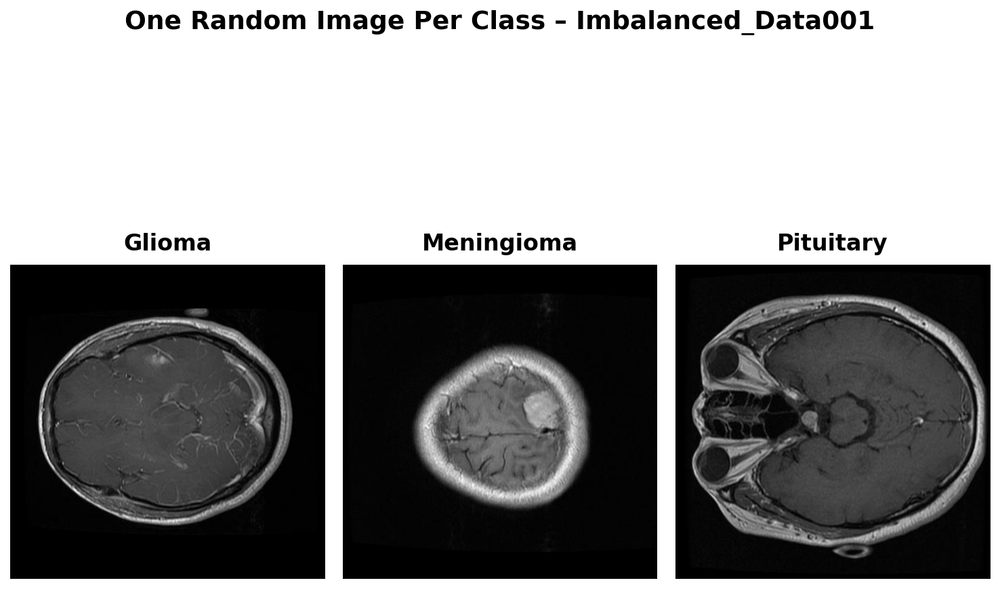


=== Imbalanced_Data001 – Preprocessing Examples ===


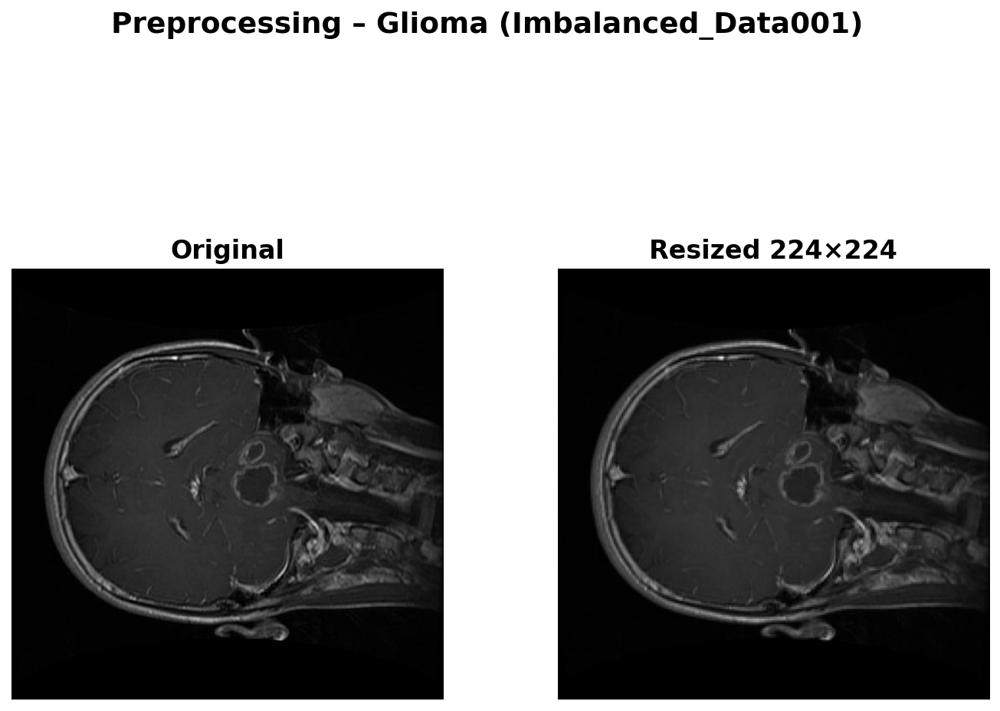

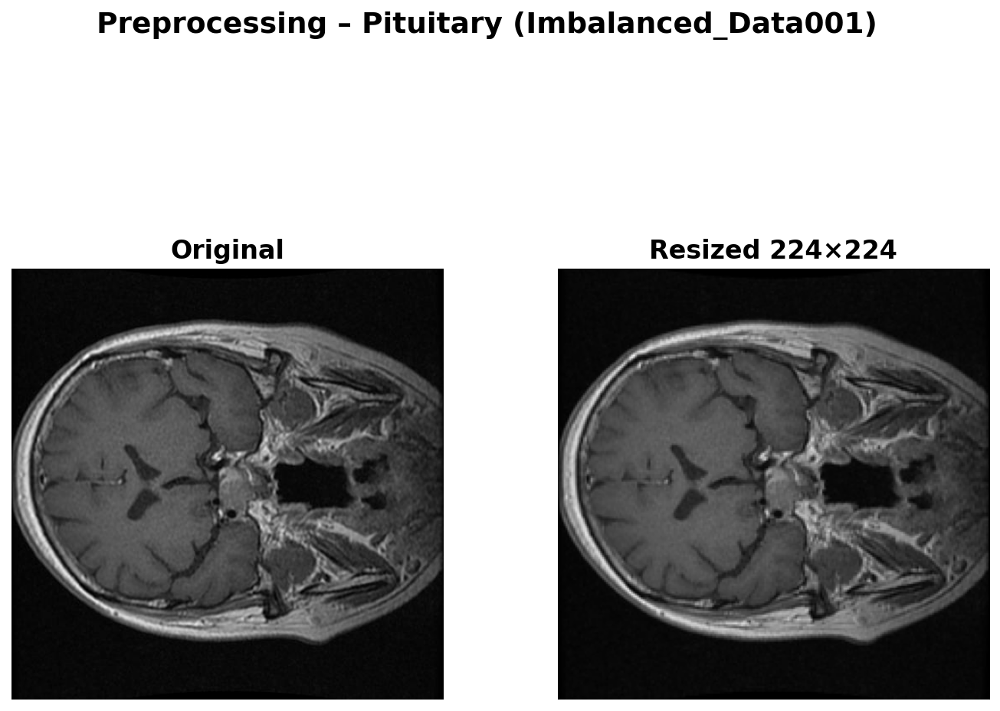

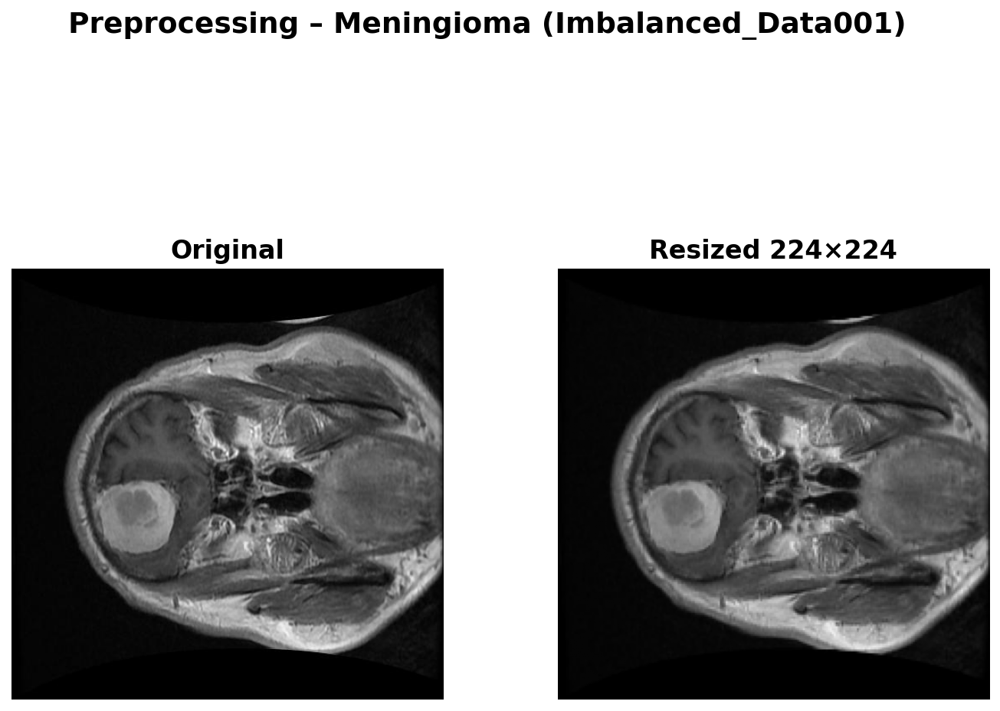

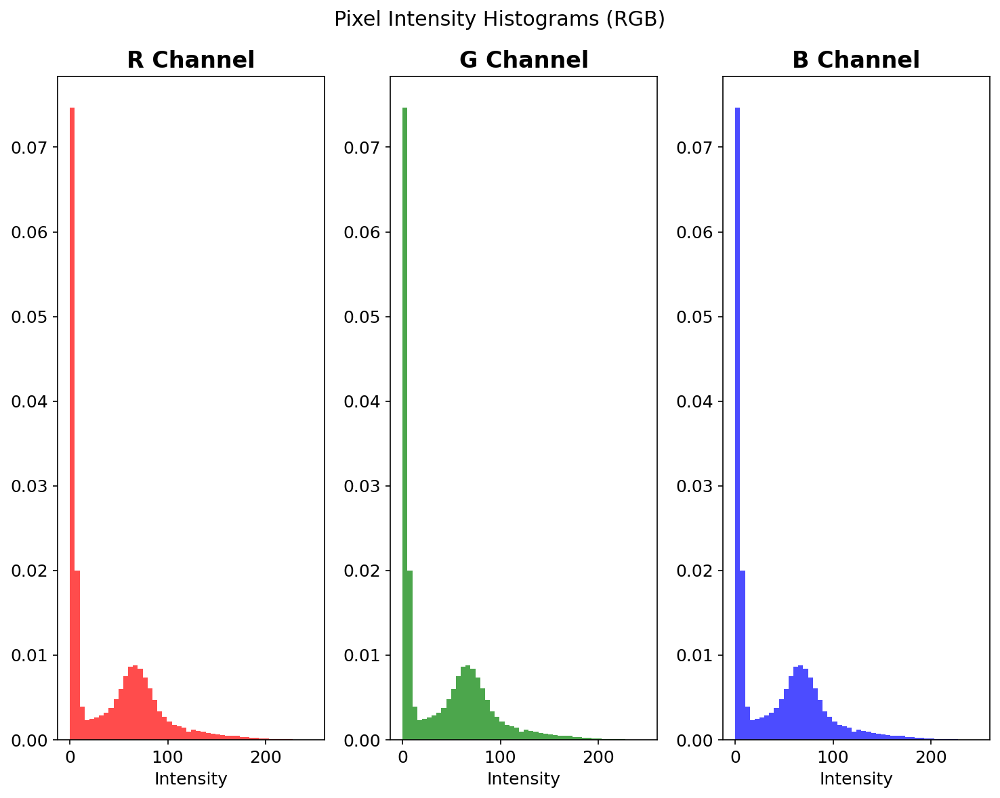

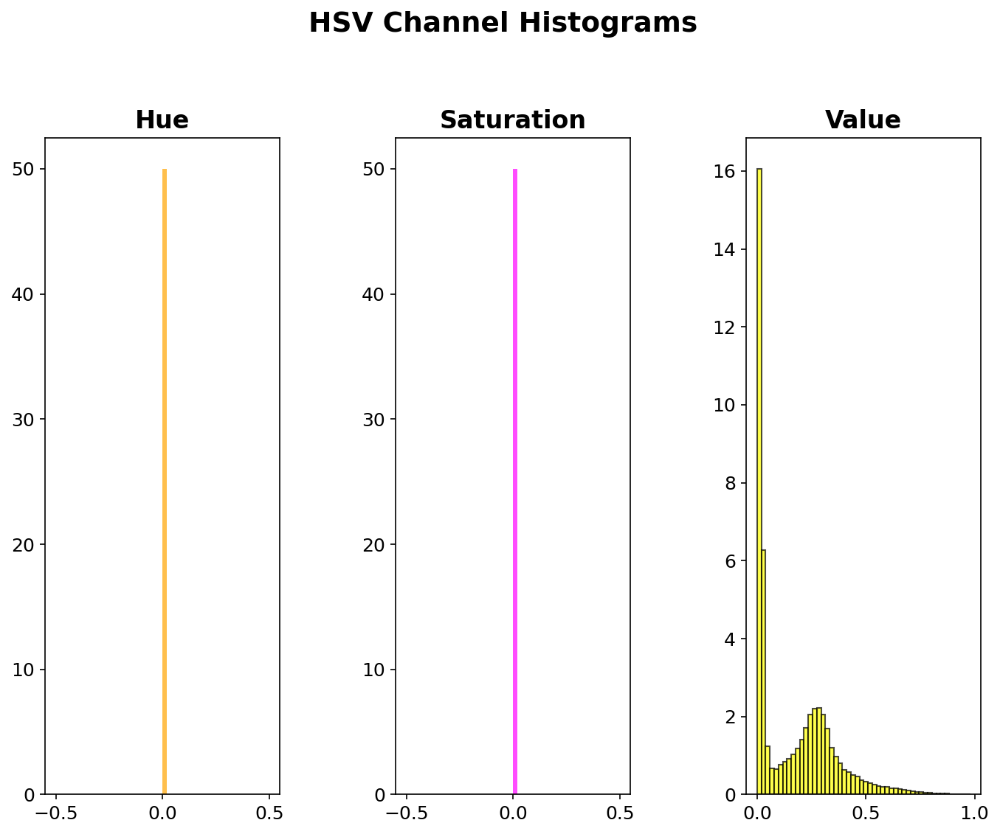

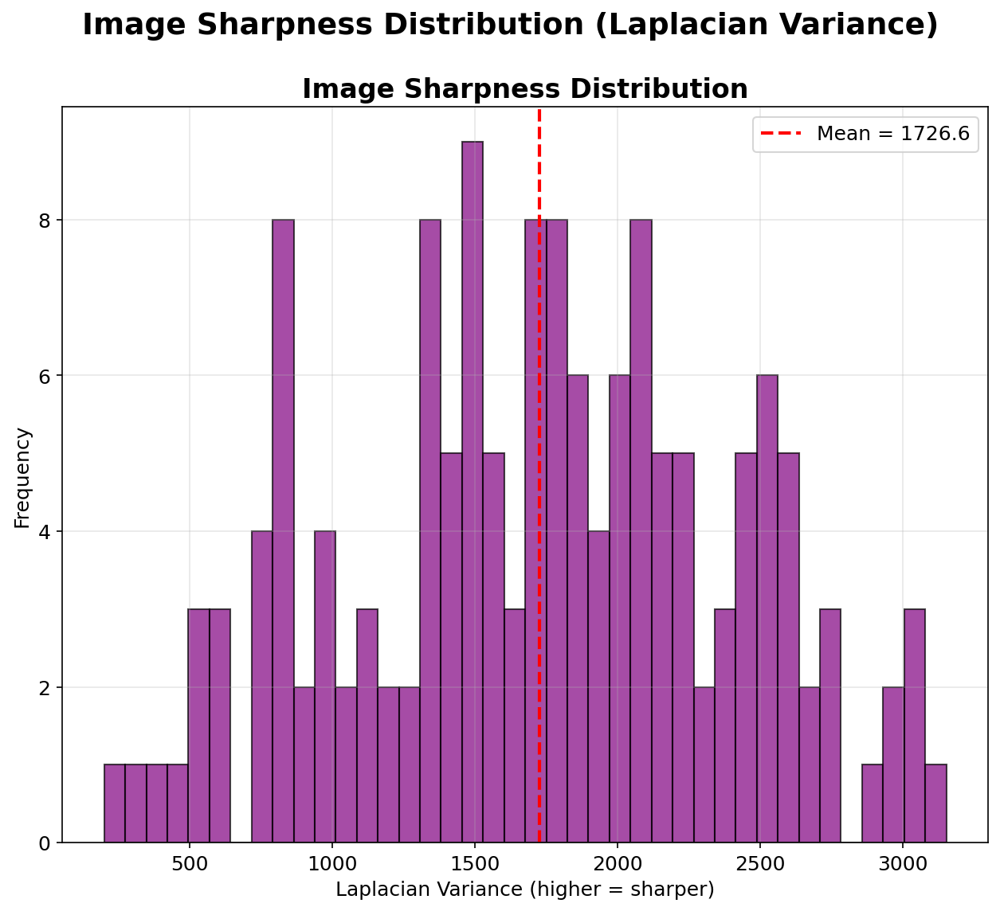

Sharpness → Mean: 1726.6 ± 671.1
Imbalanced_Data001 → Sharpness (Laplacian variance): 1726.6 ± 671.1

=== Imbalanced_Data001 – Edge Detection Examples ===


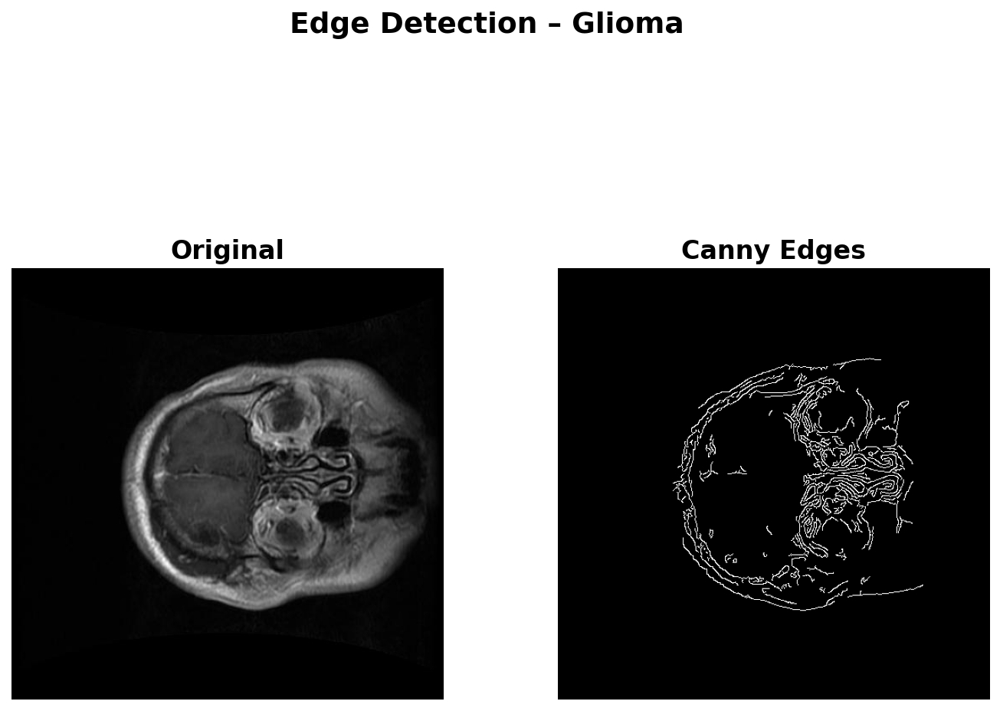

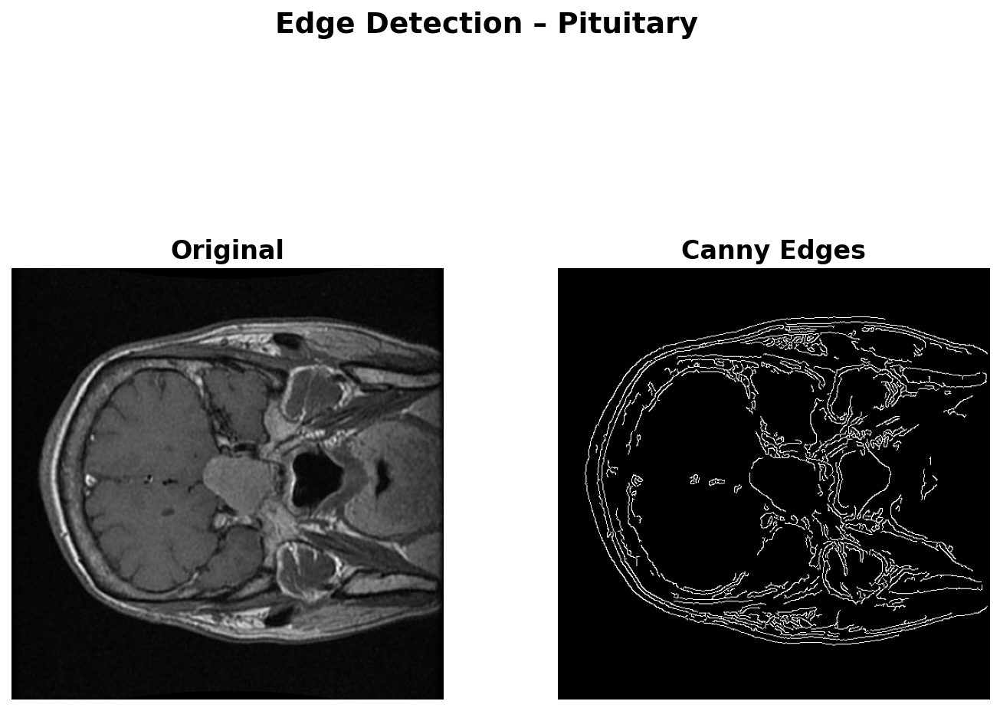

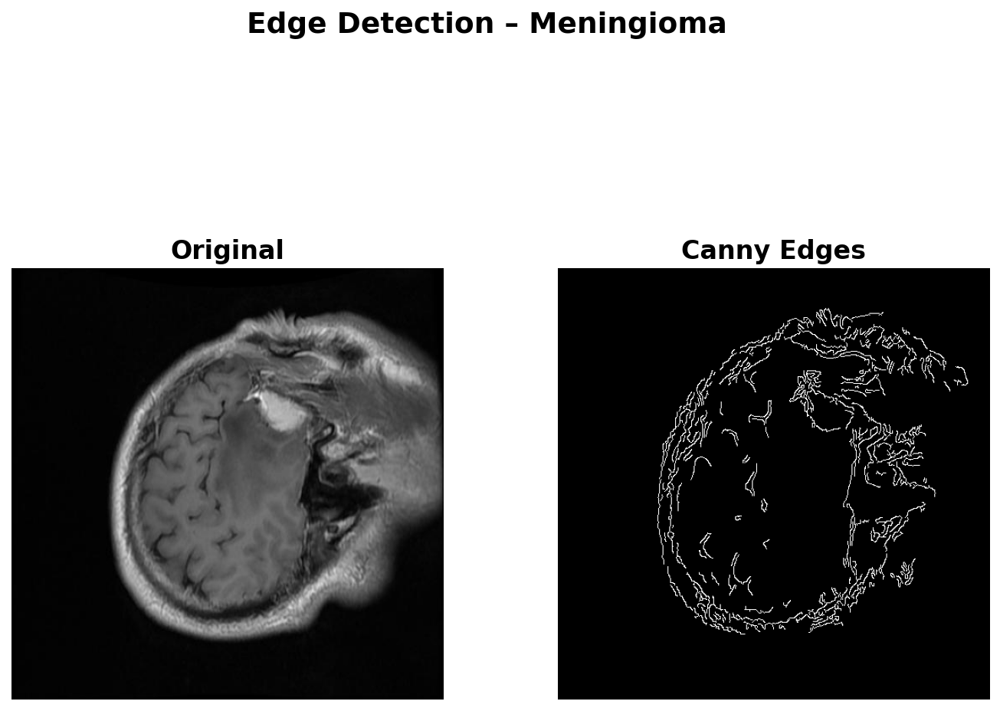


=== Imbalanced_Data001 – Augmentation Preview ===


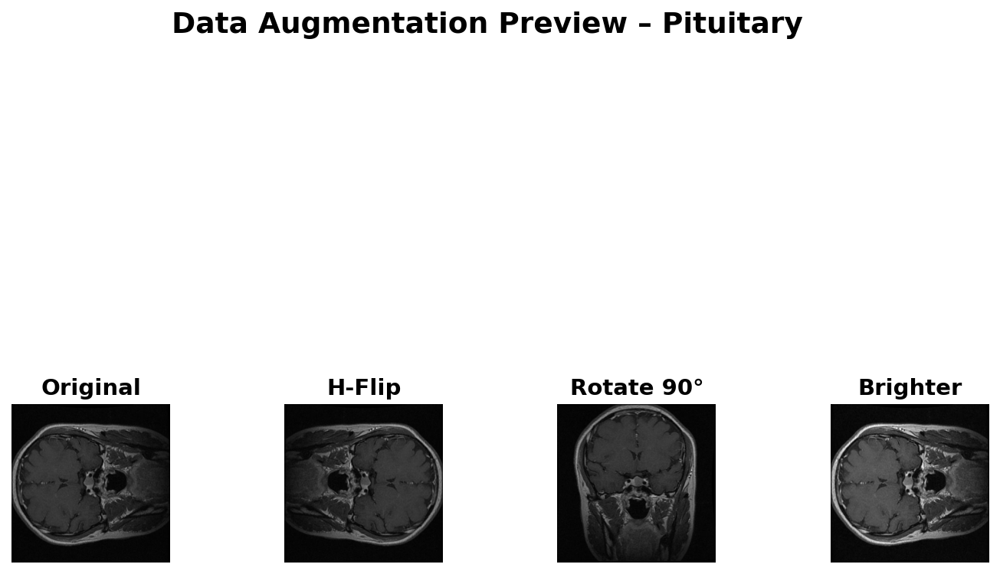

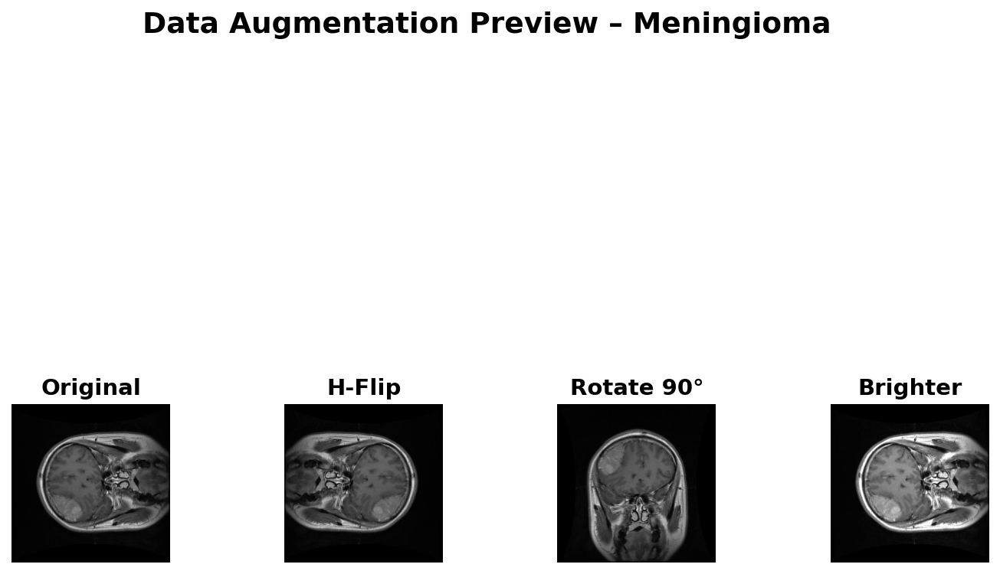

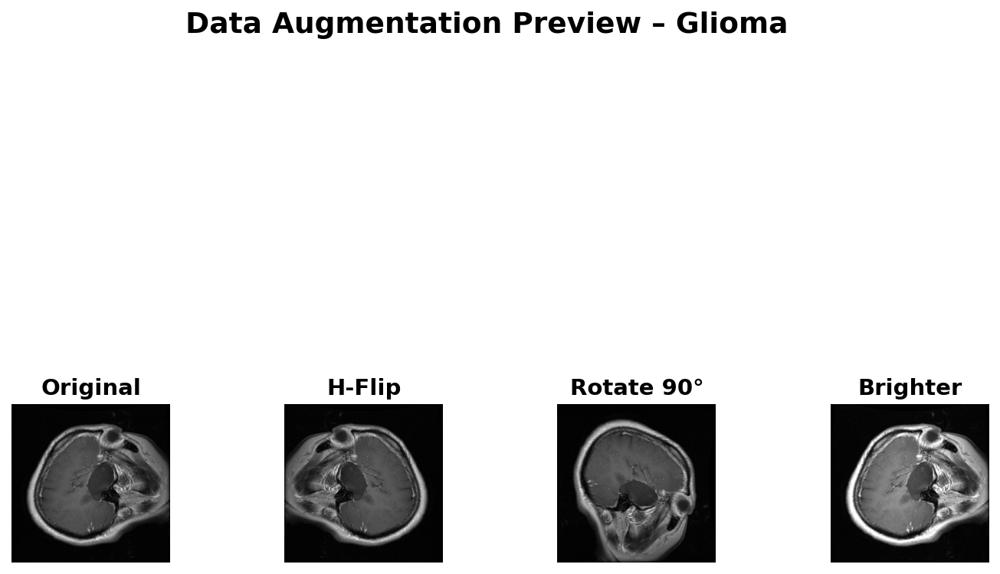

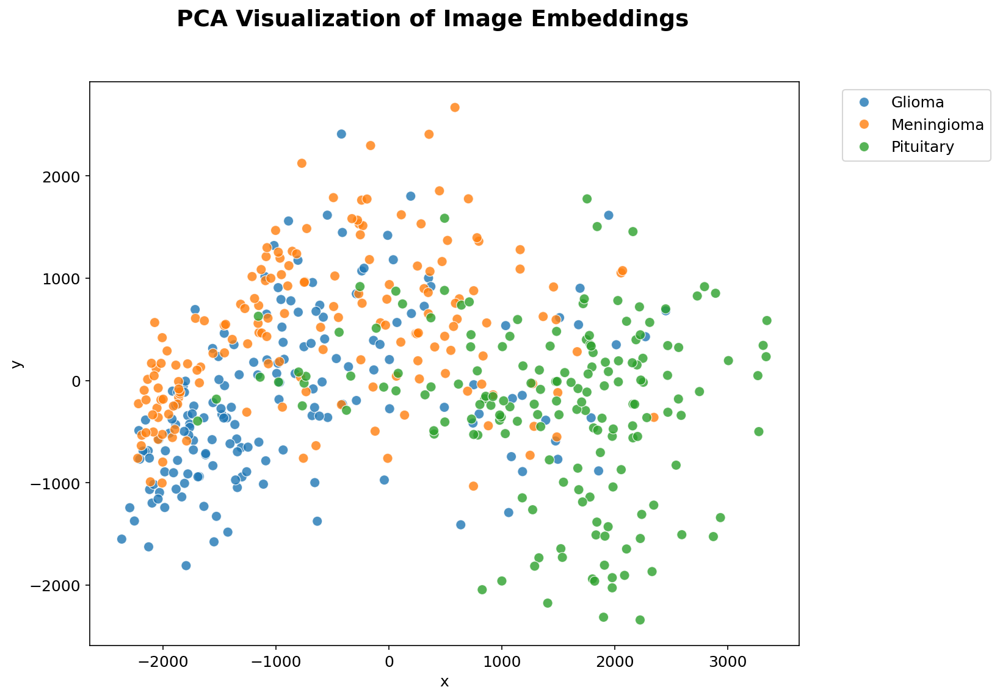

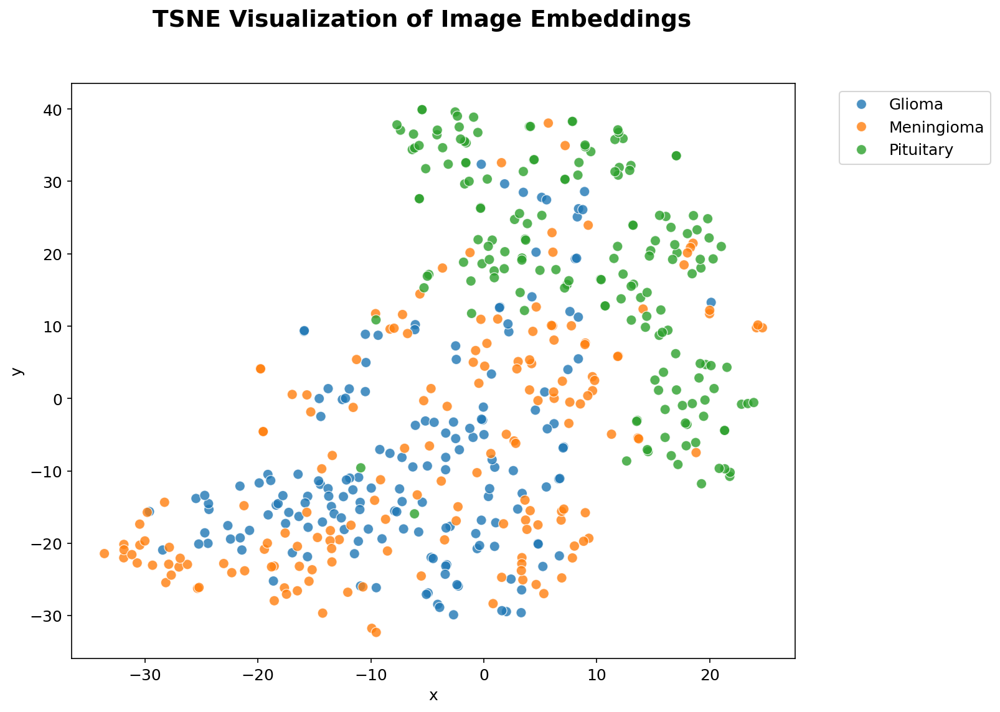

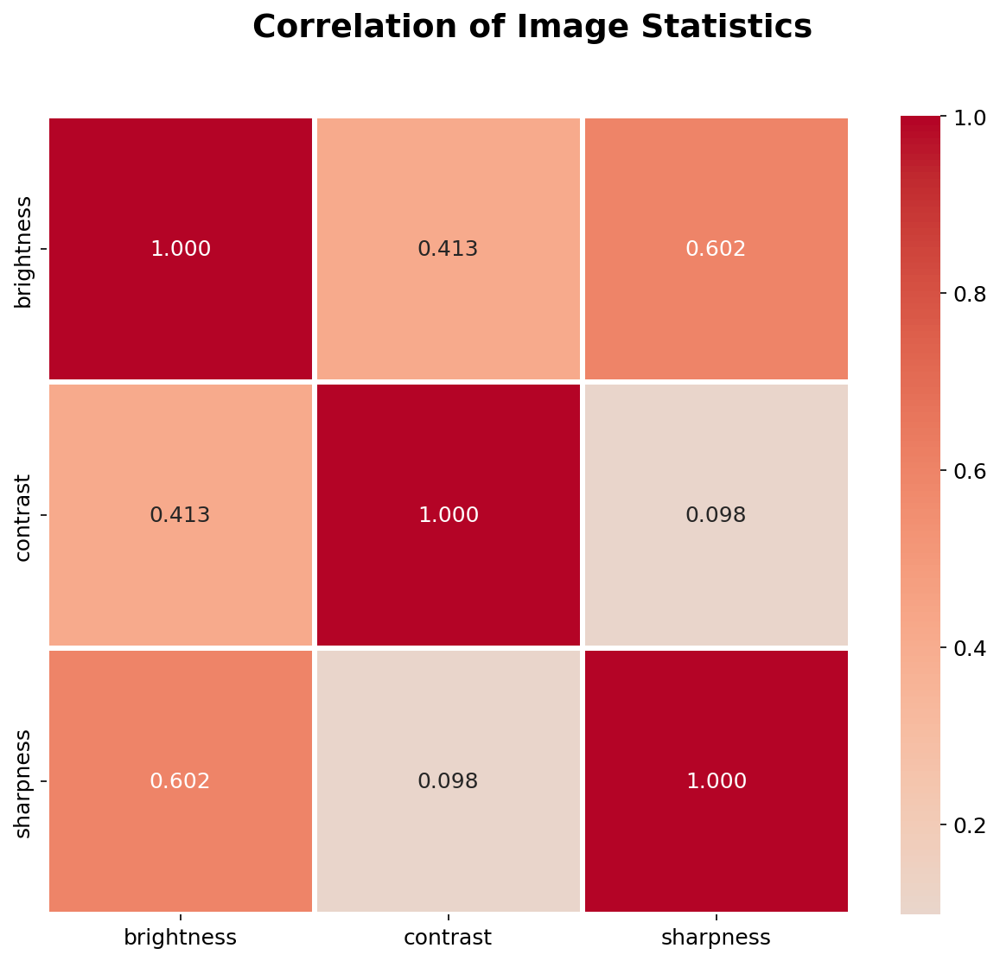

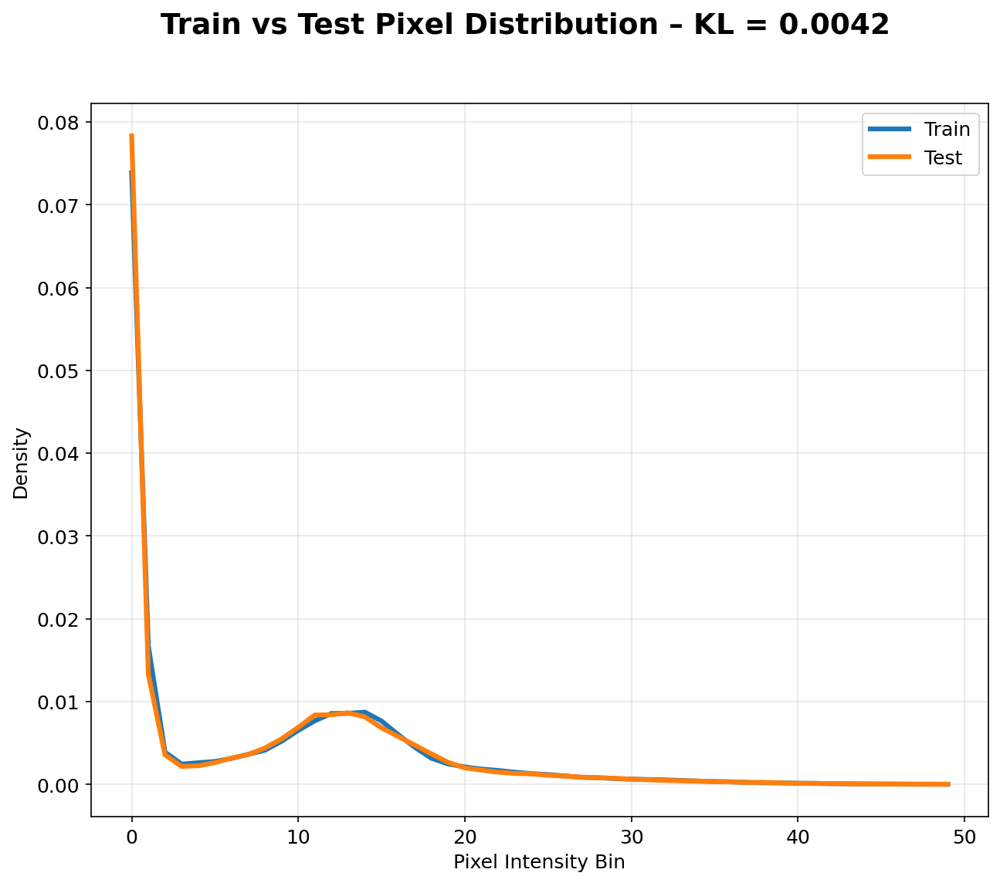

KL-divergence = 0.0042

────────────────────────────────────────────────────────────────────────────────────────────────


════════════════════════════════════════════════════════════════════════════════════════════════
████████████████████████████████  EXPLORING: Balanced_Data001  █████████████████████████████████
════════════════════════════════════════════════════════════════════════════════════════════════


=== Balanced_Data001 – File Metadata Sample ===


,class,file,size_kb,format,date
0,Glioma,2711.jpg,17.2,JPEG,2025-11-30
1,Meningioma,424.jpg,18.9,JPEG,2025-11-30
2,Meningioma,149.jpg,14.2,JPEG,2025-11-30
3,Meningioma,582.jpg,21.9,JPEG,2025-11-30
4,Glioma,2072.jpg,15.6,JPEG,2025-11-30
5,Glioma,2994.jpg,27.6,JPEG,2025-11-30
6,Meningioma,57.jpg,17.4,JPEG,2025-11-30
7,Pituitary,1444.jpg,24.8,JPEG,2025-11-30
8,Glioma,2461.jpg,21.9,JPEG,2025-11-30
9,Glioma,2333.jpg,14.2,JPEG,2025-11-30


Total sampled images: 100
Formats found: ['JPEG']
Average size: 20.9 KB


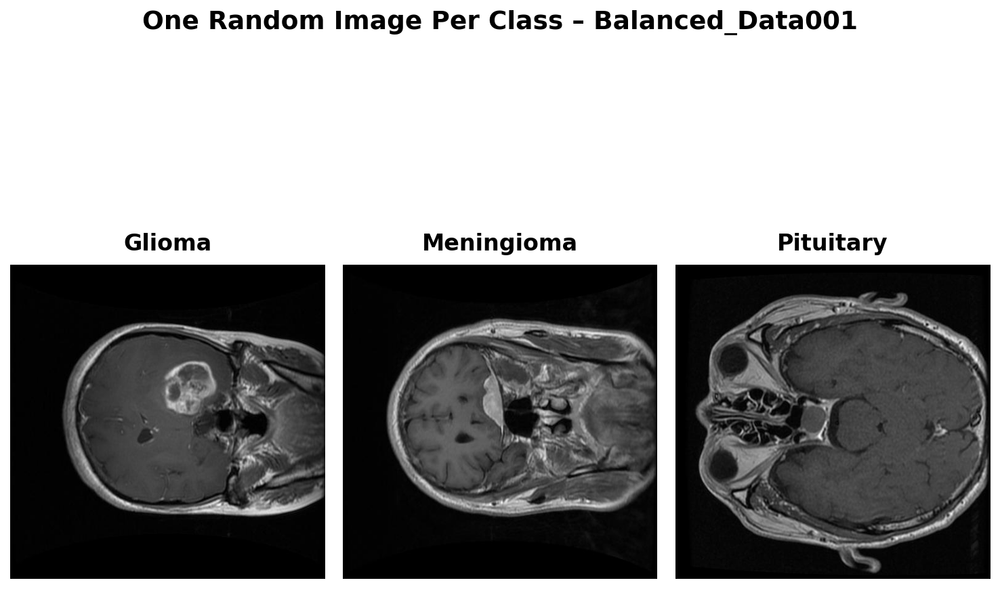


=== Balanced_Data001 – Preprocessing Examples ===


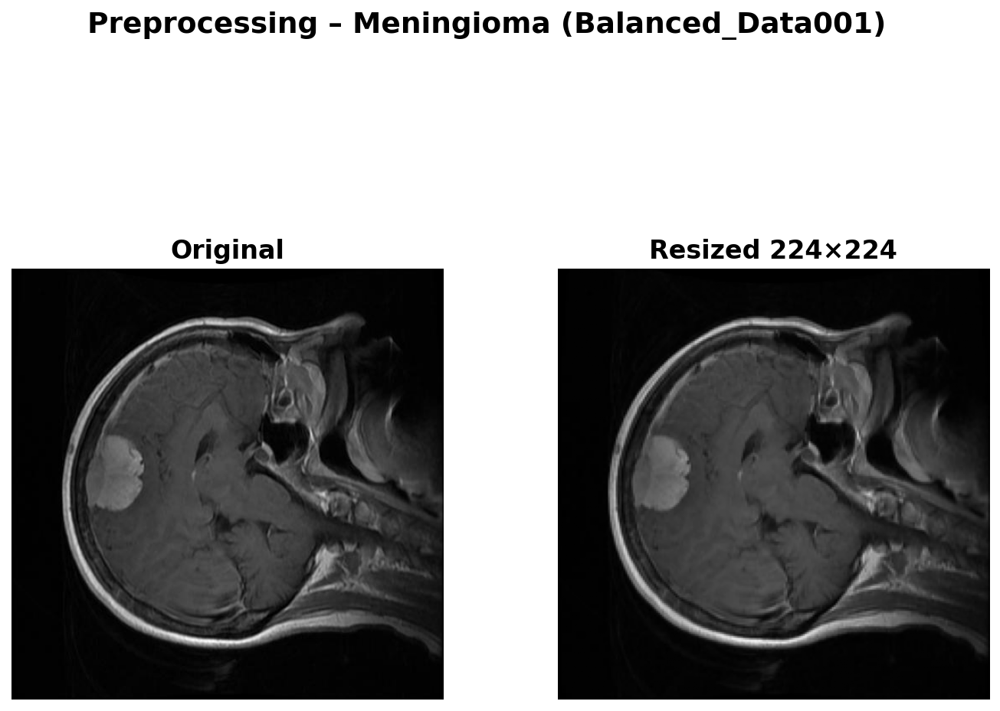

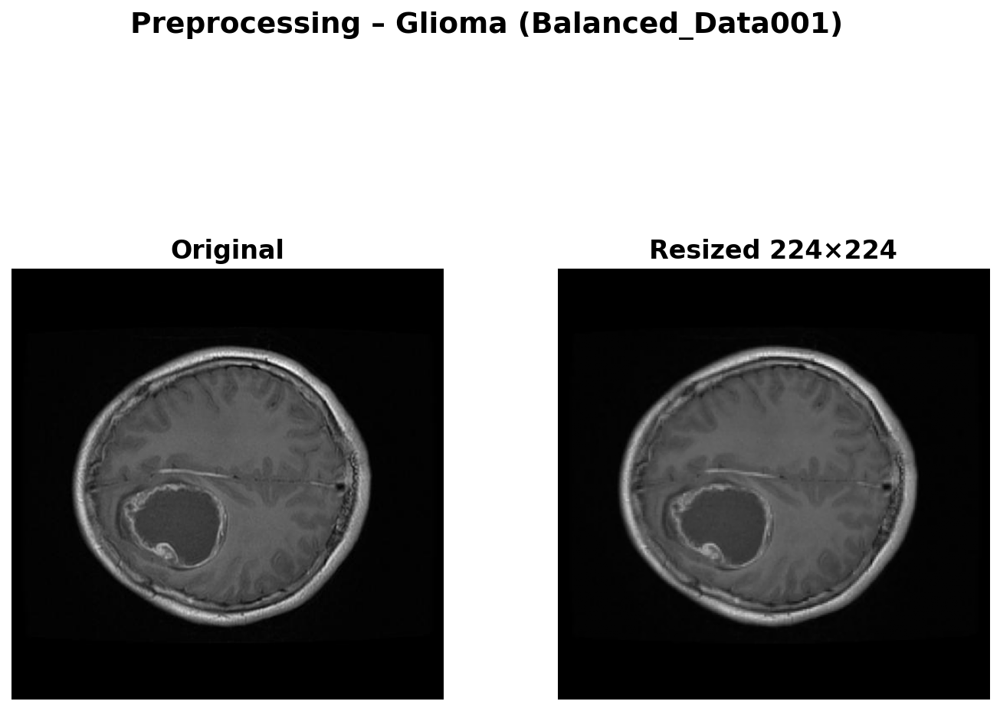

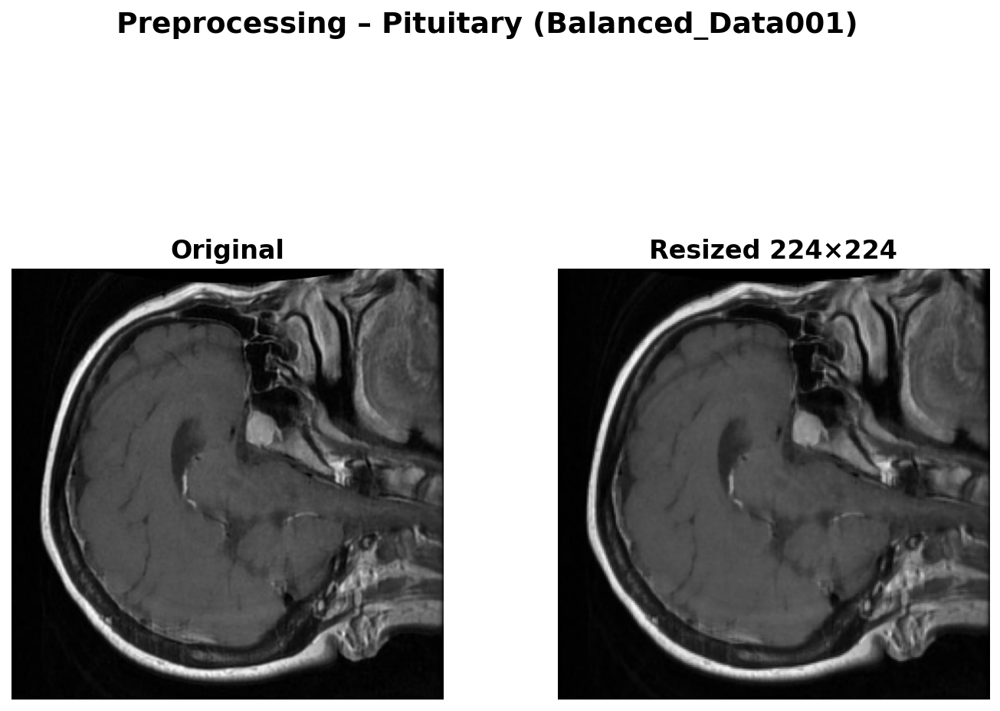

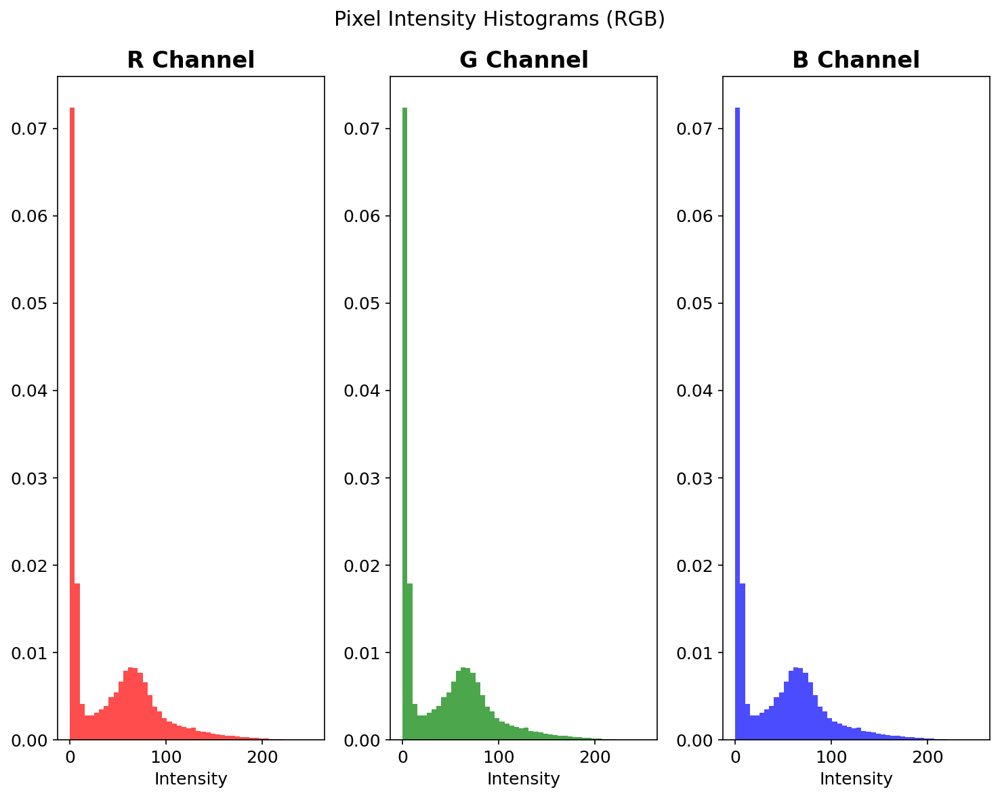

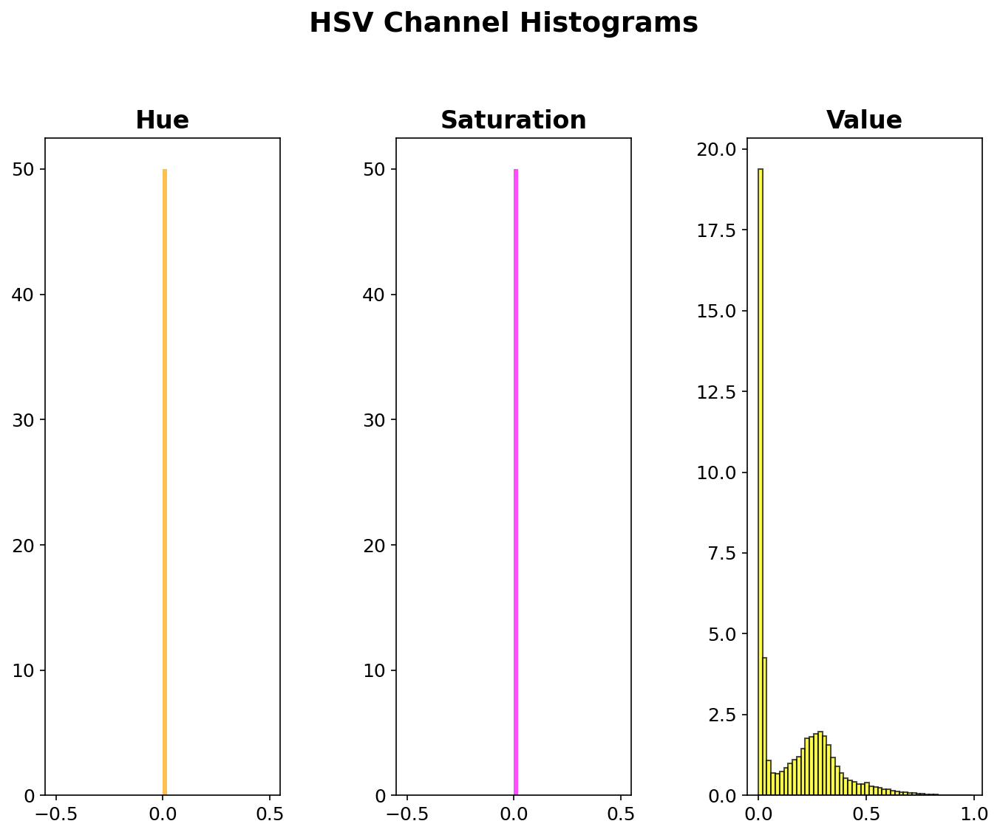

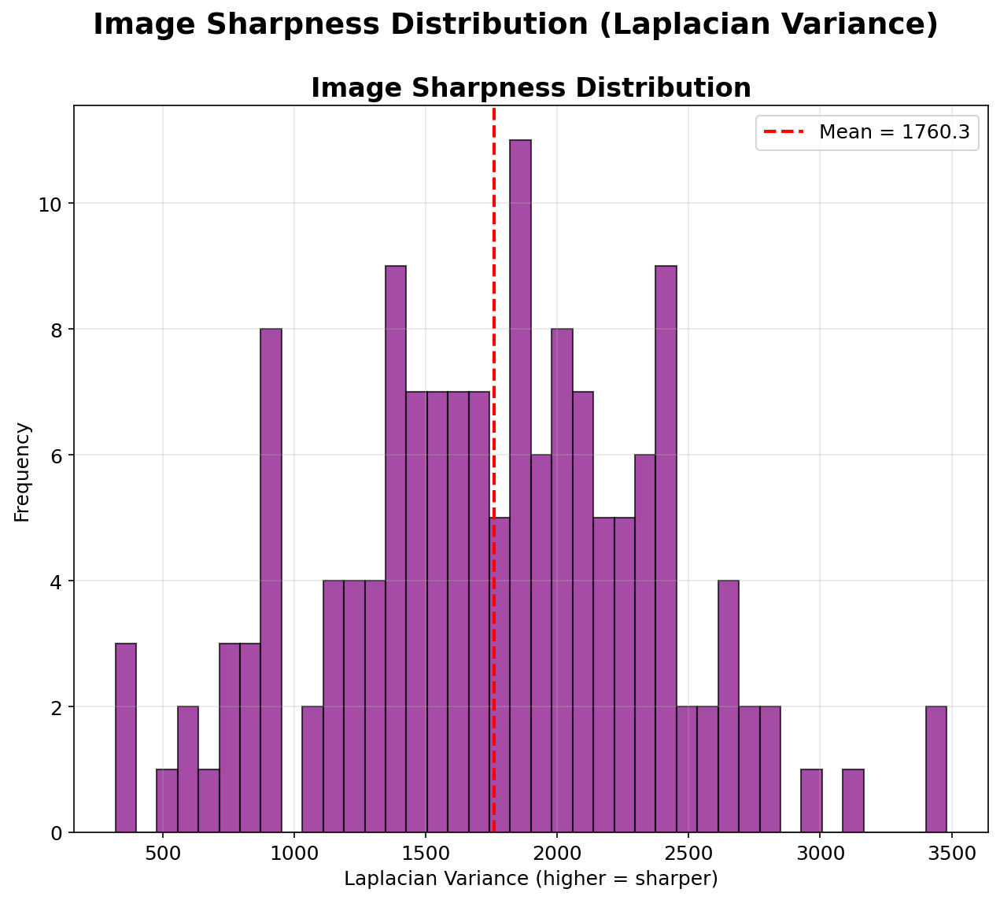

Sharpness → Mean: 1760.3 ± 618.2
Balanced_Data001 → Sharpness (Laplacian variance): 1760.3 ± 618.2

=== Balanced_Data001 – Edge Detection Examples ===


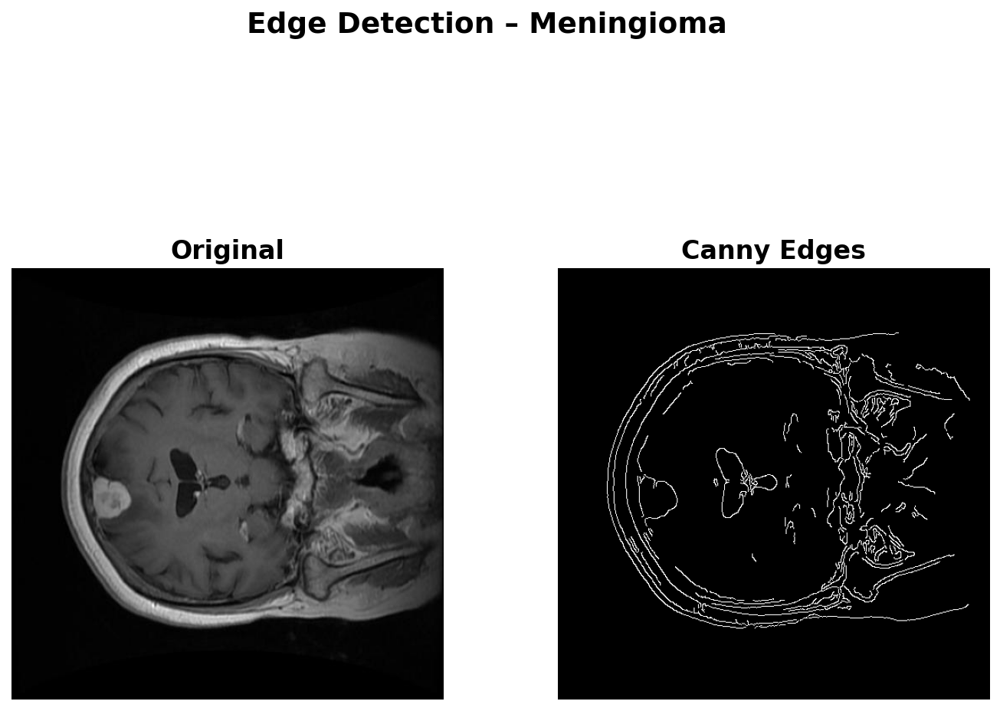

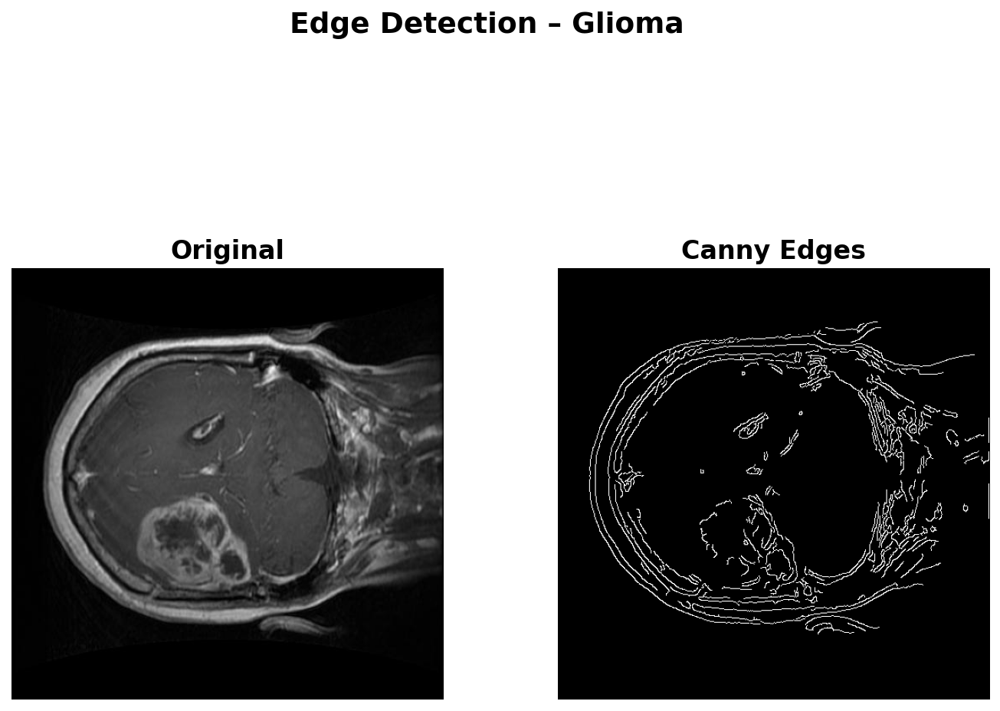

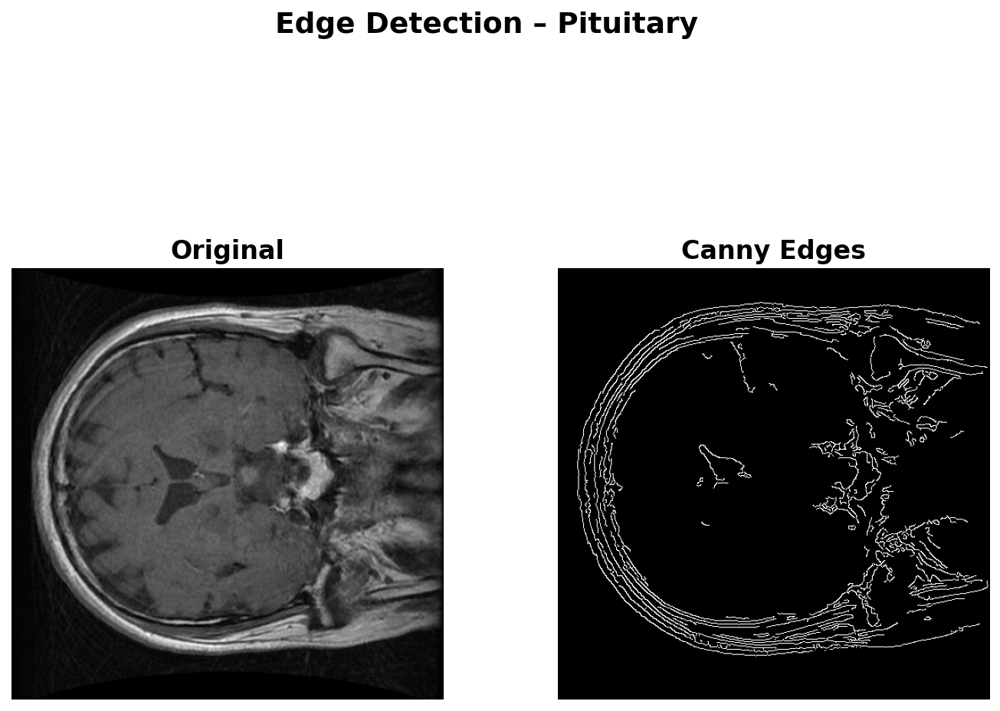


=== Balanced_Data001 – Augmentation Preview ===


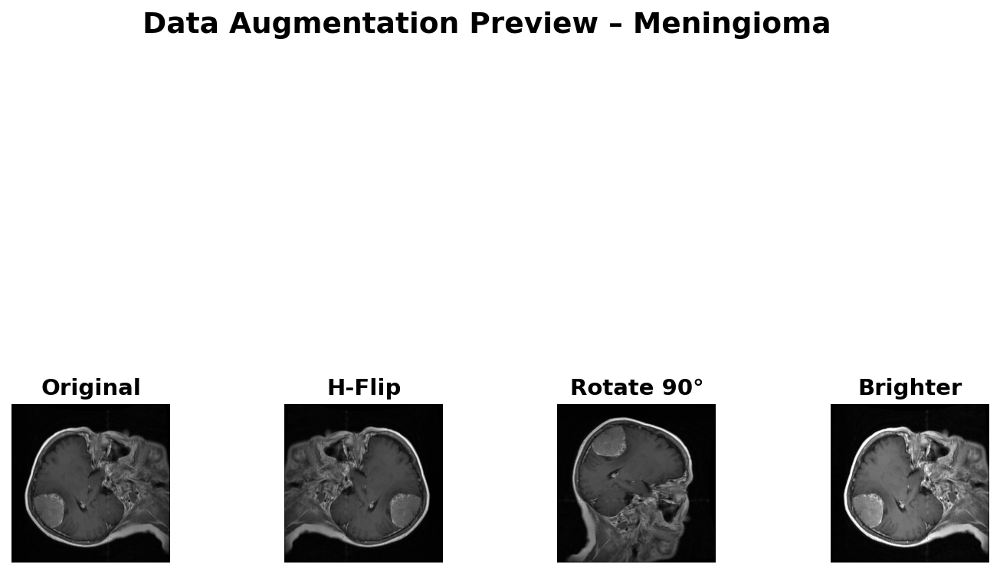

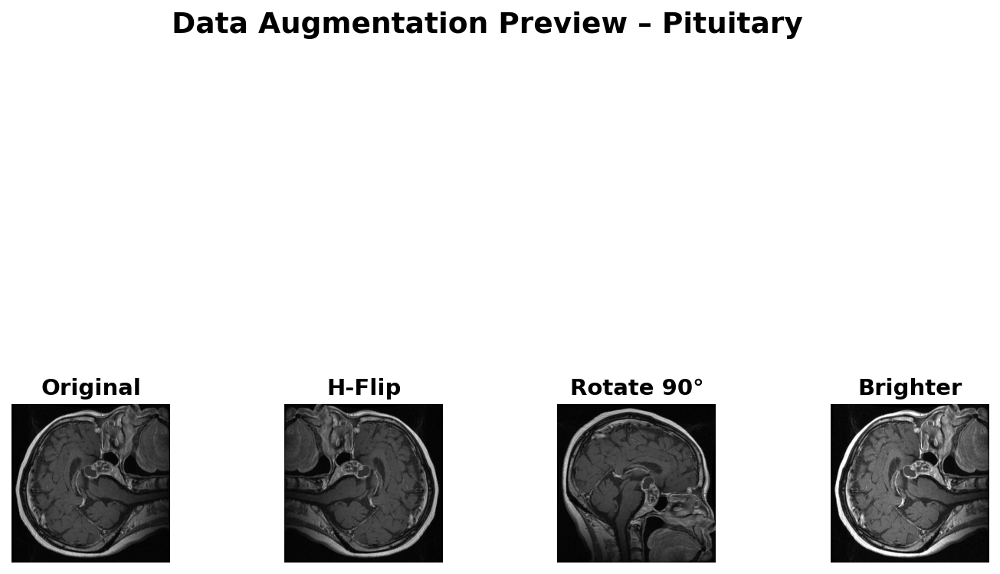

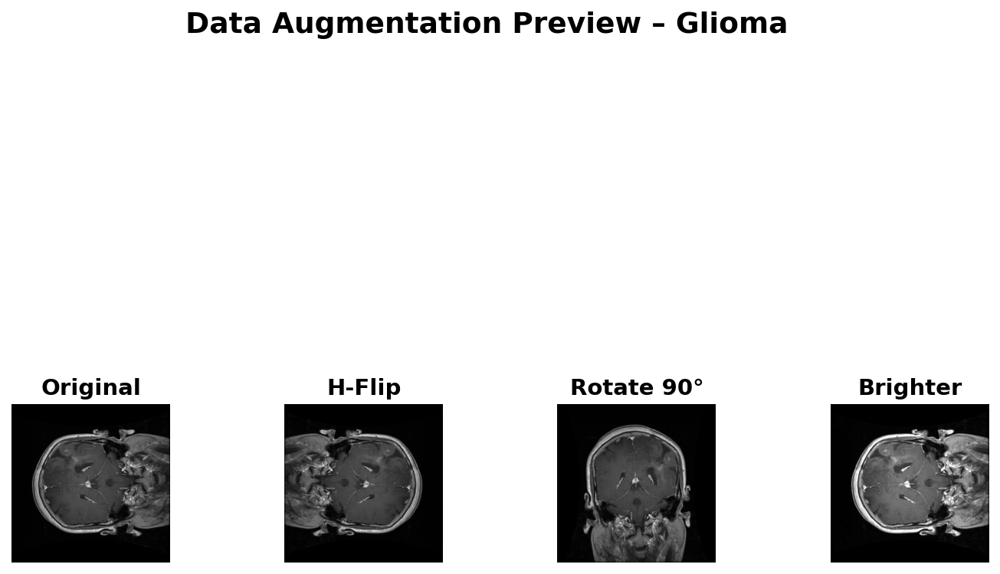

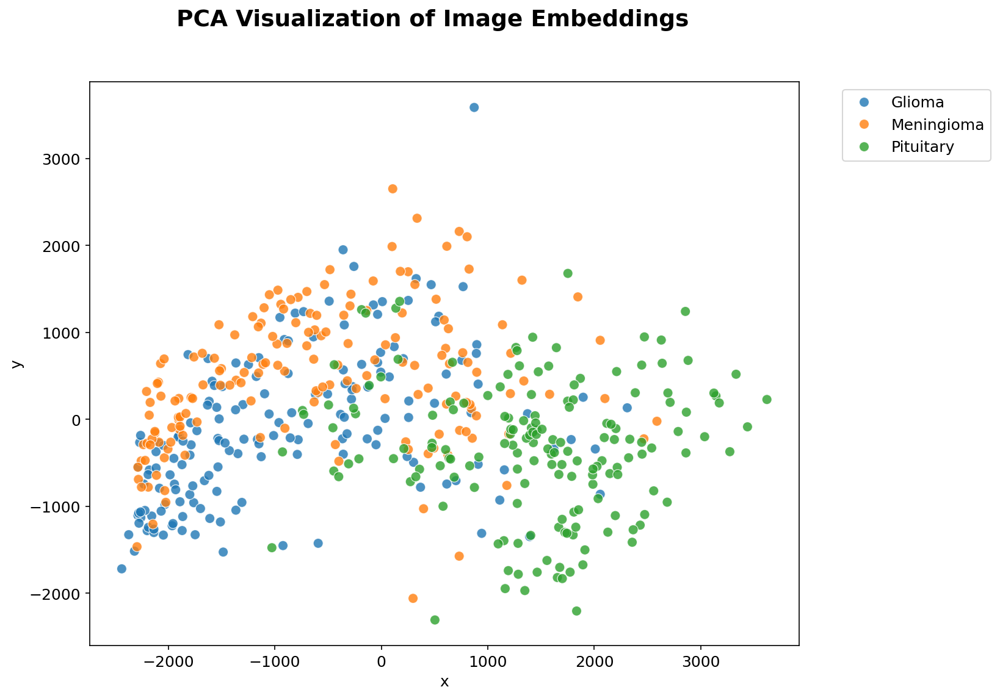

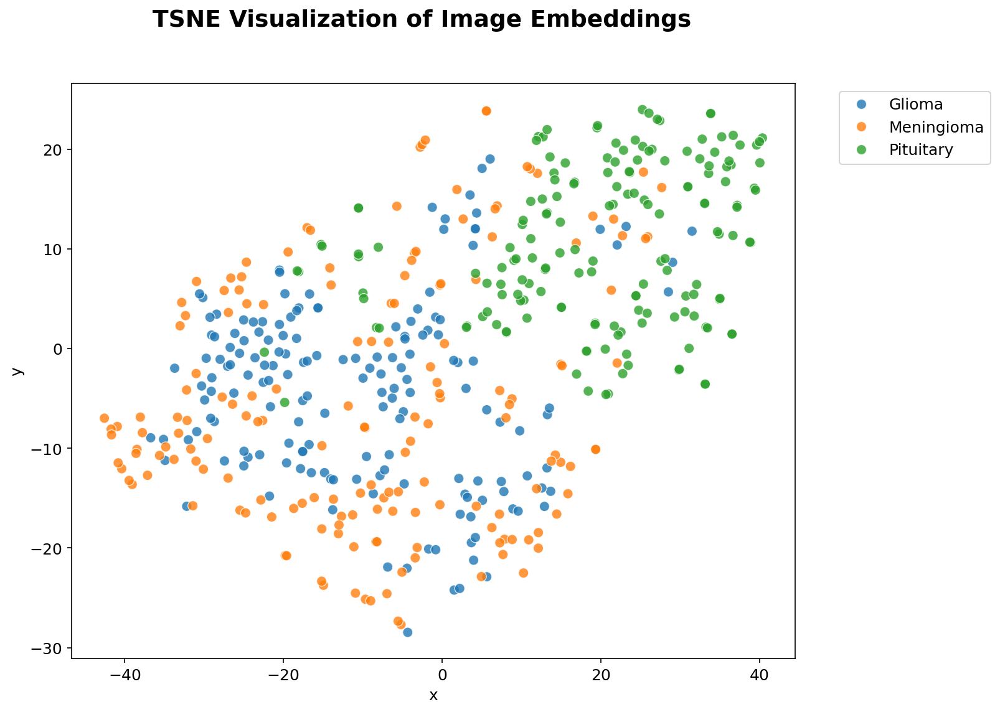

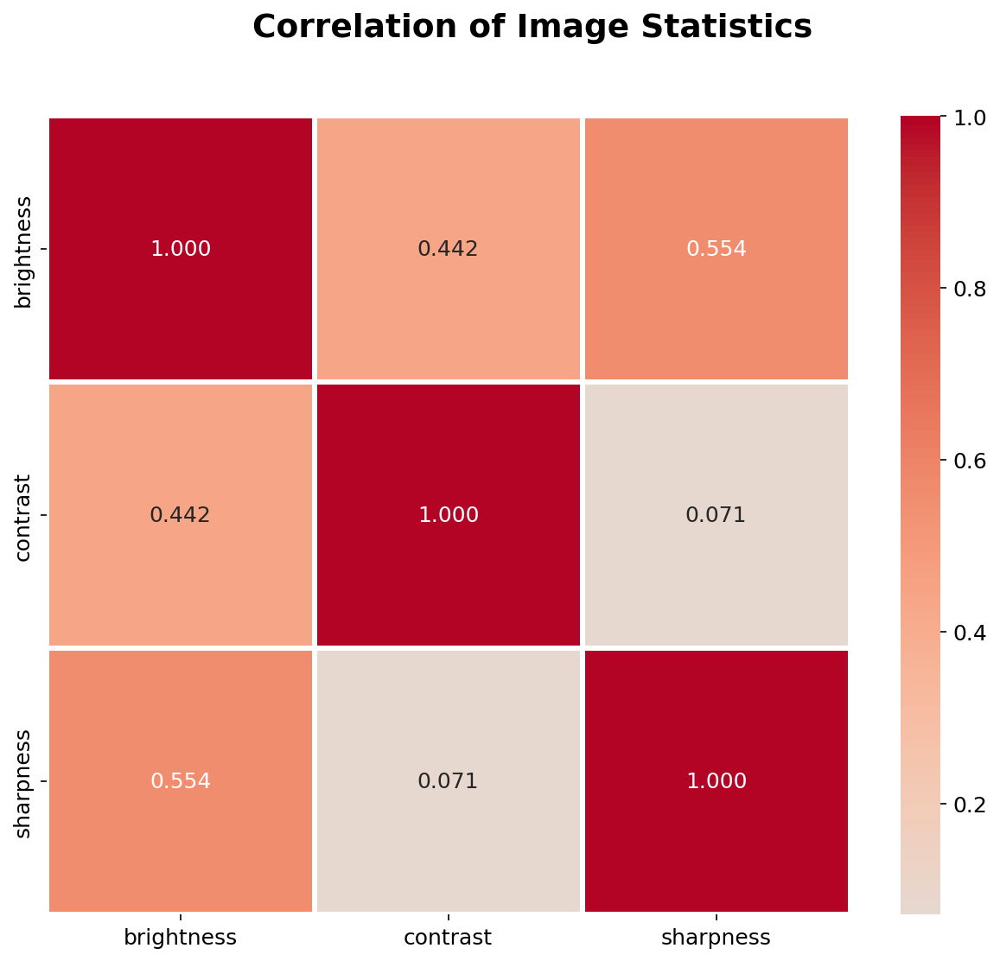

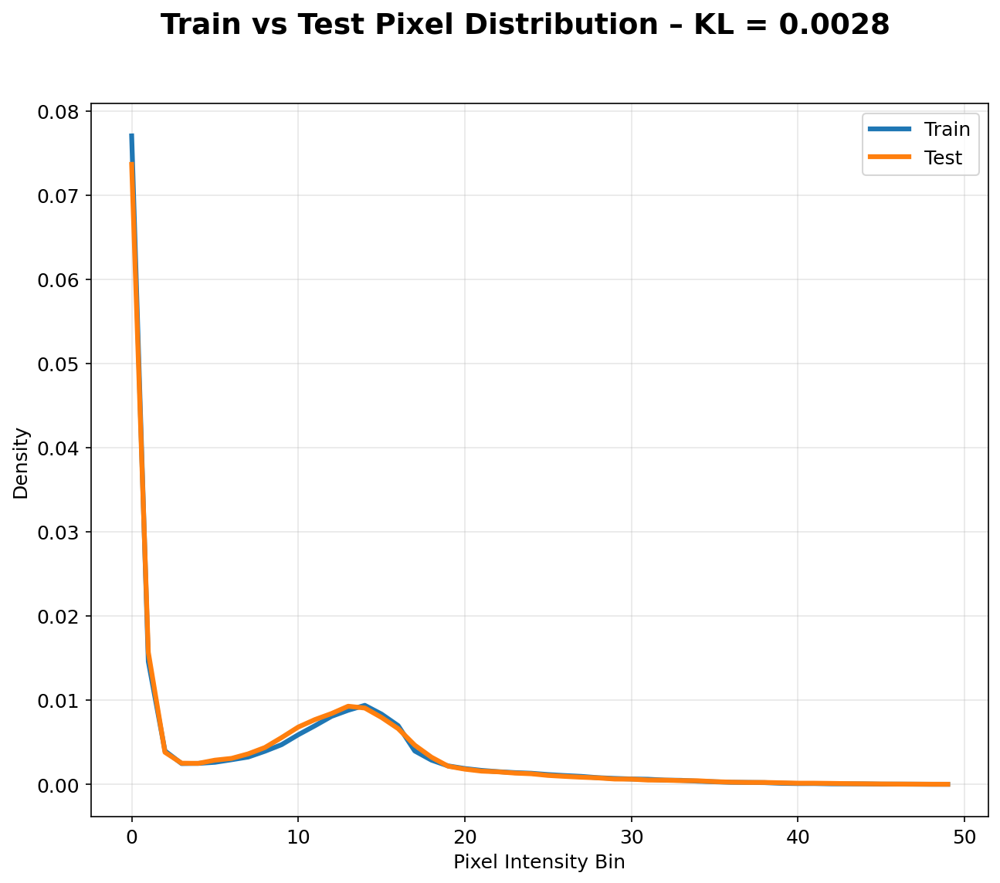

KL-divergence = 0.0028

────────────────────────────────────────────────────────────────────────────────────────────────


████████████████████████████████████████████████████████████████████████████████████████████████
                  BRAIN TUMOR MRI DATASET EXPLORATION COMPLETED SUCCESSFULLY!                   
████████████████████████████████████████████████████████████████████████████████████████████████


In [5]:
def get_all_classes(directory):
    return sorted([d for d in os.listdir(directory) if os.path.isdir(os.path.join(directory, d))])

def file_metadata_check(dataset_key):
    directory = datasets[dataset_key]["train"]
    metadata = []
    all_files = []
    for cls in get_all_classes(directory):
        cls_path = os.path.join(directory, cls)
        files = [f for f in os.listdir(cls_path) if f.lower().endswith(('.png','.jpg','.jpeg','.bmp','.tiff'))]
        sampled = random.sample(files, min(100, len(files)))
        all_files.extend([os.path.join(cls_path, f) for f in sampled])
    random.shuffle(all_files)
    for fp in all_files[:100]:
        try:
            size = os.path.getsize(fp)
            mtime = os.path.getmtime(fp)
            with Image.open(fp) as img:
                fmt = img.format
            metadata.append({
                'class': os.path.basename(os.path.dirname(fp)),
                'file': os.path.basename(fp),
                'size_kb': round(size / 1024, 1),
                'format': fmt,
                'date': pd.to_datetime(mtime, unit='s').strftime('%Y-%m-%d')
            })
        except Exception as e:
            print(f"Error {fp}: {e}")
    df = pd.DataFrame(metadata)
    print(f"\n=== {datasets[dataset_key]['name']} – File Metadata Sample ===")
    display(df.head(10))
    print(f"Total sampled images: {len(df)}")
    print(f"Formats found: {df['format'].unique()}")
    print(f"Average size: {df['size_kb'].mean():.1f} KB")
    return df

def show_one_image_per_class(dataset_key):
    directory = datasets[dataset_key]["train"]
    classes = get_all_classes(directory)
    new_fig(f"One Random Image Per Class – {datasets[dataset_key]['name']}")
    n = len(classes)
    cols = min(n, 3)
    rows = (n + cols - 1) // cols
    for i, cls in enumerate(classes):
        cls_path = os.path.join(directory, cls)
        imgs = [f for f in os.listdir(cls_path) if f.lower().endswith(('.png','.jpg','.jpeg'))]
        if not imgs: continue
        img_path = os.path.join(cls_path, random.choice(imgs))
        img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(cls, fontsize=16, pad=10)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

def interactive_image_browser(dataset_key, n_samples=40):
    directory = datasets[dataset_key]["train"]
    samples = []
    classes = get_all_classes(directory)
    per_class = max(1, n_samples // len(classes))
    for cls in classes:
        cls_path = os.path.join(directory, cls)
        imgs = [f for f in os.listdir(cls_path) if f.lower().endswith(('.png','.jpg','.jpeg'))]
        for f in random.sample(imgs, min(per_class, len(imgs))):
            fp = os.path.join(cls_path, f)
            img = cv2.imread(fp)
            if img is not None:
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img_rgb = cv2.resize(img_rgb, (128, 128))
                samples.append({'class': cls, 'file': f, 'img': img_rgb})
    df = pd.DataFrame(samples)
    df['thumbnail'] = df['img'].apply(lambda x: f'<img src="data:image/png;base64,{cv2.imencode(".png", cv2.cvtColor(x, cv2.COLOR_RGB2BGR))[1].tobytes().hex()}">')
    fig = px.scatter(df, x='class', y='file', color='class', hover_data=['thumbnail'],
                     title=f"Interactive Browser – {datasets[dataset_key]['name']}")
    fig.update_traces(marker=dict(size=16))
    fig.show()
    
def before_after_preprocessing(dataset_key, class_name):
    directory = datasets[dataset_key]["train"]
    cls_path = os.path.join(directory, class_name)
    imgs = [f for f in os.listdir(cls_path) if f.lower().endswith(('.png','.jpg','.jpeg'))]
    if not imgs: return
    img_name = random.choice(imgs)
    fp = os.path.join(cls_path, img_name)
    orig = cv2.cvtColor(cv2.imread(fp), cv2.COLOR_BGR2RGB)
    norm = cv2.resize(orig, (224, 224)) / 255.0
    fig, axs = new_fig_1x2(f"Preprocessing – {class_name} ({datasets[dataset_key]['name']})")
    axs[0].imshow(orig); axs[0].set_title("Original"); axs[0].axis('off')
    axs[1].imshow(norm); axs[1].set_title("Resized 224×224"); axs[1].axis('off')
    plt.show()

def plot_hsv_histograms(directory):
    h, s, v = [], [], []
    for cls in get_all_classes(directory):
        cls_path = os.path.join(directory, cls)
        files = [f for f in os.listdir(cls_path) if f.lower().endswith(('.png','.jpg','.jpeg'))]
        for f in random.sample(files, min(20, len(files))):
            img = cv2.cvtColor(cv2.imread(os.path.join(cls_path, f)), cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (64,64))
            hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
            h.extend((hsv[:,:,0] * 2).ravel())           # Hue 0–360
            s.extend((hsv[:,:,1] / 255.0).ravel())       # Saturation
            v.extend((hsv[:,:,2] / 255.0).ravel())       # Value
    fig, axs = new_fig_1x3("HSV Channel Histograms")
    axs[0].hist(h, bins=50, color='orange', alpha=0.7, density=True); axs[0].set_title('Hue')
    axs[1].hist(s, bins=50, color='magenta', alpha=0.7, density=True); axs[1].set_title('Saturation')
    axs[2].hist(v, bins=50, color='yellow', alpha=0.7, density=True, edgecolor='black'); axs[2].set_title('Value')
    plt.show()

def compute_blurriness(directory):
    variances = []
    for cls in get_all_classes(directory):
        cls_path = os.path.join(directory, cls)
        files = [f for f in os.listdir(cls_path) if f.lower().endswith(('.png','.jpg','.jpeg','.bmp','.tiff'))]
        sampled = random.sample(files, min(50, len(files))) if files else []
        for f in sampled:
            gray = cv2.imread(os.path.join(cls_path, f), cv2.IMREAD_GRAYSCALE)
            if gray is None:
                continue
            gray = cv2.resize(gray, (128, 128))
            laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()
            variances.append(laplacian_var)
    
    if not variances:
        print("Warning: No images processed for blurriness analysis.")
        mean_var = std_var = 0
    else:
        mean_var = np.mean(variances)
        std_var  = np.std(variances)
    
    # Plot
    new_fig("Image Sharpness Distribution (Laplacian Variance)")
    plt.hist(variances, bins=40, color='purple', alpha=0.7, edgecolor='black')
    plt.axvline(mean_var, color='red', linestyle='--', linewidth=2, 
                label=f'Mean = {mean_var:.1f}')
    plt.xlabel('Laplacian Variance (higher = sharper)')
    plt.ylabel('Frequency')
    plt.title('Image Sharpness Distribution')
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()
    
    print(f"Sharpness → Mean: {mean_var:.1f} ± {std_var:.1f}")
    
    return mean_var, std_var   # ← THIS WAS MISSING!

def edge_detection_overlays(directory, class_name):
    cls_path = os.path.join(directory, class_name)
    files = [f for f in os.listdir(cls_path) if f.lower().endswith(('.png','.jpg','.jpeg'))]
    if not files: return
    fp = os.path.join(cls_path, random.choice(files))
    orig = cv2.imread(fp)
    gray = cv2.cvtColor(orig, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 100, 200)
    fig, axs = new_fig_1x2(f"Edge Detection – {class_name}")
    axs[0].imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)); axs[0].set_title("Original"); axs[0].axis('off')
    axs[1].imshow(edges, cmap='gray'); axs[1].set_title("Canny Edges"); axs[1].axis('off')
    plt.show()

def augmentation_previews(directory, class_name):
    cls_path = os.path.join(directory, class_name)
    files = [f for f in os.listdir(cls_path) if f.lower().endswith(('.png','.jpg','.jpeg'))]
    if not files: return
    fp = os.path.join(cls_path, random.choice(files))
    img = cv2.imread(fp)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    flip = cv2.flip(rgb, 1)
    rot = cv2.rotate(rgb, cv2.ROTATE_90_CLOCKWISE)
    bright = np.clip(rgb.astype(np.float32) * 1.5, 0, 255).astype(np.uint8)
    fig, axs = new_fig_1x4(f"Data Augmentation Preview – {class_name}")
    for ax, im, t in zip(axs, [rgb, flip, rot, bright], ["Original", "H-Flip", "Rotate 90°", "Brighter"]):
        ax.imshow(im); ax.set_title(t, fontsize=14); ax.axis('off')
    plt.show()

def pca_tsne_visualization(directory, method='PCA'):
    X, y = [], []
    classes = get_all_classes(directory)
    per_class = max(1, 500 // len(classes))
    for cls in classes:
        cls_path = os.path.join(directory, cls)
        files = [f for f in os.listdir(cls_path) if f.lower().endswith(('.png','.jpg','.jpeg'))]
        for f in random.sample(files, min(per_class, len(files))):
            img = cv2.imread(os.path.join(cls_path, f))
            if img is not None:
                img = cv2.resize(img, (64,64))
                X.append(img.flatten())
                y.append(cls)
    X = np.array(X)
    reducer = PCA(n_components=2, random_state=42) if method == 'PCA' else TSNE(n_components=2, random_state=42)
    X2 = reducer.fit_transform(X)
    df = pd.DataFrame({'x': X2[:,0], 'y': X2[:,1], 'class': y})
    new_fig(f"{method} Visualization of Image Embeddings")
    sns.scatterplot(data=df, x='x', y='y', hue='class', palette='tab10', alpha=0.8, s=60)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

def correlation_matrix_stats(directory):
    stats = []
    for cls in get_all_classes(directory):
        cls_path = os.path.join(directory, cls)
        files = [f for f in os.listdir(cls_path) if f.lower().endswith(('.png','.jpg','.jpeg'))]
        for f in random.sample(files, min(30, len(files))):
            img = cv2.imread(os.path.join(cls_path, f))
            if img is not None:
                gray = cv2.cvtColor(cv2.resize(img, (128,128)), cv2.COLOR_BGR2GRAY)
                stats.append([np.mean(gray), np.std(gray), cv2.Laplacian(gray, cv2.CV_64F).var()])
    df = pd.DataFrame(stats, columns=['brightness', 'contrast', 'sharpness'])
    corr = df.corr()
    new_fig("Correlation of Image Statistics")
    sns.heatmap(corr, annot=True, cmap='coolwarm', center=0, linewidths=2, fmt='.3f')
    plt.show()
    
def plot_pixel_histograms(directory, sample_size=20, resize_shape=(64, 64)):
    """RGB histograms (averaged over all classes)."""
    pixels = {'R': [], 'G': [], 'B': []}
    for cls in get_all_classes(directory):
        cls_path = os.path.join(directory, cls)
        imgs = random.sample([f for f in os.listdir(cls_path)
                              if f.lower().endswith(('.png', '.jpg', '.jpeg'))],
                             min(sample_size, 100))
        for f in imgs:
            img = cv2.imread(os.path.join(cls_path, f))
            if img is not None:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, resize_shape)
                for c, ch in enumerate(['R', 'G', 'B']):
                    pixels[ch].extend(img[:, :, c].ravel())
    fig, axs = new_fig_1x3("Pixel Intensity Histograms (RGB Channels)")
    for ax, (ch, col) in zip(axs, [('R', 'red'), ('G', 'green'), ('B', 'blue')]):
        ax.hist(pixels[ch], bins=50, color=col, alpha=0.7, density=True)
        ax.set_title(f'{ch} Channel')
        ax.set_xlabel('Intensity')
    plt.suptitle('Pixel Intensity Histograms (RGB)')
    plt.tight_layout()
    plt.show()

def subset_distribution_shift(train_dir, test_dir):
    def get_hist(dir_):
        pixels = []
        for cls in get_all_classes(dir_):
            cls_path = os.path.join(dir_, cls)
            files = [f for f in os.listdir(cls_path) if f.lower().endswith(('.png','.jpg','.jpeg'))]
            for f in random.sample(files, min(20, len(files))):
                gray = cv2.imread(os.path.join(cls_path, f), 0)
                if gray is not None:
                    gray = cv2.resize(gray, (64,64))
                    pixels.extend(gray.ravel())
        h, _ = np.histogram(pixels, bins=50, density=True)
        return h + 1e-10
    h_train = get_hist(train_dir)
    h_test = get_hist(test_dir)
    kl = entropy(h_train, h_test)
    new_fig(f"Train vs Test Pixel Distribution – KL = {kl:.4f}")
    plt.plot(h_train, label='Train', linewidth=3)
    plt.plot(h_test,  label='Test',  linewidth=3)
    plt.legend()
    plt.xlabel("Pixel Intensity Bin")
    plt.ylabel("Density")
    plt.grid(alpha=0.3)
    plt.show()
    print(f"KL-divergence = {kl:.4f}")

datasets_to_analyze = ["Imbalanced_Data001", "Balanced_Data001"]

for key in datasets_to_analyze:
    name = datasets[key]["name"]
    train_dir = datasets[key]["train"]
    test_dir  = datasets[key]["test"]
    
    print("\n" + "═"*96)
    print(f"  EXPLORING: {name}  ".center(96, "█"))
    print("═"*96 + "\n")

    df_meta = file_metadata_check(key)

    show_one_image_per_class(key)

    interactive_image_browser(key, n_samples=50)

    print(f"\n=== {name} – Preprocessing Examples ===")
    for cls in random.sample(get_all_classes(train_dir), min(6, len(get_all_classes(train_dir)))):
        before_after_preprocessing(key, cls)

    plot_pixel_histograms(train_dir)
    plot_hsv_histograms(train_dir)

    mean_sharp, std_sharp = compute_blurriness(train_dir)
    print(f"{name} → Sharpness (Laplacian variance): {mean_sharp:.1f} ± {std_sharp:.1f}")

    print(f"\n=== {name} – Edge Detection Examples ===")
    for cls in random.sample(get_all_classes(train_dir), min(6, len(get_all_classes(train_dir)))):
        edge_detection_overlays(train_dir, cls)

    print(f"\n=== {name} – Augmentation Preview ===")
    for cls in random.sample(get_all_classes(train_dir), min(6, len(get_all_classes(train_dir)))):
        augmentation_previews(train_dir, cls)

    pca_tsne_visualization(train_dir, method='PCA')
    pca_tsne_visualization(train_dir, method='TSNE')

    correlation_matrix_stats(train_dir)

    subset_distribution_shift(train_dir, test_dir)

    print("\n" + "─"*96 + "\n")


print("\n" + "█"*96)
print("   BRAIN TUMOR MRI DATASET EXPLORATION COMPLETED SUCCESSFULLY!   ".center(96))
print("█"*96)

# Data Generator

In [3]:
# ============================= CONFIG =============================
target_size = (224, 224)
batch_size = 32
EPOCHS_INITIAL = 80

balance_dataset_name = "Balanced_Data001"
imbalance_dataset_name = "Imbalanced_Data001"

balance_train_dir = datasets[balance_dataset_name]["train"]
balance_test_dir  = datasets[balance_dataset_name]["test"]
imbalance_train_dir = datasets[imbalance_dataset_name]["train"]
imbalance_test_dir  = datasets[imbalance_dataset_name]["test"]

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest'
)

val_test_datagen = ImageDataGenerator(rescale=1./255)


def create_generators(train_dir, test_dir):
    
    train_gen = train_datagen.flow_from_directory(
        directory=train_dir,
        target_size=target_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True,
        seed=42
    )
    
    test_gen = val_test_datagen.flow_from_directory(
        directory=test_dir,
        target_size=target_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )
    
    assert train_gen.class_indices == test_gen.class_indices, " Train/Test classes mismatch!"

    train_files = set([os.path.basename(f) for f in train_gen.filenames])
    test_files  = set([os.path.basename(f) for f in test_gen.filenames])
    overlap = train_files.intersection(test_files)
    if overlap:
        print(f"⚠ WARNING: {len(overlap)} overlapping file names found. Clean your dataset!")
    
    print(f"Classes: {train_gen.class_indices}")
    print(f"Train samples: {train_gen.samples}")
    print(f"Test samples:  {test_gen.samples}\n")
    
    return train_gen, test_gen

print("Loading Balanced Dataset...")
balance_train_gen, balance_test_gen = create_generators(balance_train_dir, balance_test_dir)

print("\nLoading Imbalanced Dataset...")
imbalance_train_gen, imbalance_test_gen = create_generators(imbalance_train_dir, imbalance_test_dir)

def compute_class_weights(generator):
    weights = compute_class_weight(
        class_weight='balanced',
        classes=np.unique(generator.classes),
        y=generator.classes
    )
    return dict(enumerate(weights))


balance_weights   = compute_class_weights(balance_train_gen)
imbalance_weights = compute_class_weights(imbalance_train_gen)


Loading Balanced Dataset...
Found 1911 images belonging to 3 classes.
Found 213 images belonging to 3 classes.
Classes: {'Glioma': 0, 'Meningioma': 1, 'Pituitary': 2}
Train samples: 1911
Test samples:  213


Loading Imbalanced Dataset...
Found 2757 images belonging to 3 classes.
Found 307 images belonging to 3 classes.
Classes: {'Glioma': 0, 'Meningioma': 1, 'Pituitary': 2}
Train samples: 2757
Test samples:  307



# Data Overview

In [4]:
table_data = [
    [
        "Balanced Dataset",
        balance_train_gen.samples,
        balance_test_gen.samples,
        balance_train_gen.samples // batch_size,
        balance_test_gen.samples // batch_size,
        balance_train_gen.num_classes
    ],
    [
        "Imbalanced Dataset",
        imbalance_train_gen.samples,
        imbalance_test_gen.samples,
        imbalance_train_gen.samples // batch_size,
        imbalance_test_gen.samples // batch_size,
        imbalance_train_gen.num_classes
    ]
]

# Table header
headers = ["Dataset", "Training Samples", "Validation Samples",
           "Steps/Epoch", "Val Steps", "Num Classes"]

# Print table
print(tabulate(table_data, headers=headers, tablefmt="grid"))

+--------------------+--------------------+----------------------+---------------+-------------+---------------+
| Dataset            |   Training Samples |   Validation Samples |   Steps/Epoch |   Val Steps |   Num Classes |
+====================+====================+======================+===============+=============+===============+
| Balanced Dataset   |               1911 |                  213 |            59 |           6 |             3 |
+--------------------+--------------------+----------------------+---------------+-------------+---------------+
| Imbalanced Dataset |               2757 |                  307 |            86 |           9 |             3 |
+--------------------+--------------------+----------------------+---------------+-------------+---------------+


# Model Architechtutre


## clean model naming

In [ ]:
def sanitize_layer_names(model):
    """Clean all layer names inside a model so TF can load it safely."""
    def clean(name):
        return re.sub(r'[^A-Za-z0-9_]+', '_', name)

    # Fix model name
    model._name = clean(model.name)

    for layer in model.layers:
        old = layer.name
        layer._name = clean(layer.name)

        # Fix config name if present
        if hasattr(layer, '_config') and isinstance(layer._config, dict):
            if "name" in layer._config:
                layer._config["name"] = clean(layer._config["name"])

        # Fix nested models
        if isinstance(layer, Model):
            sanitize_layer_names(layer)

    return model


def cbam_block(input_feature, ratio=8, kernel_size=7, name=None):
    """ Convolutional Block Attention Module """
    channel = K.int_shape(input_feature)[-1]
    if channel is None:
        raise ValueError("cbam_block requires a statically-known channel dimension")

    avg_pool = layers.GlobalAveragePooling2D()(input_feature)
    max_pool = layers.GlobalMaxPooling2D()(input_feature)
    shared_dense_one = layers.Dense(channel // ratio, activation='relu', use_bias=False)
    shared_dense_two = layers.Dense(channel, use_bias=False)
    avg_out = shared_dense_two(shared_dense_one(avg_pool))
    max_out = shared_dense_two(shared_dense_one(max_pool))
    channel_attention = layers.Add()([avg_out, max_out])
    channel_attention = layers.Activation('sigmoid')(channel_attention)
    channel_attention = layers.Reshape((1, 1, channel))(channel_attention)
    x = layers.Multiply()([input_feature, channel_attention])

    avg_spatial = tf.reduce_mean(x, axis=-1, keepdims=True)
    max_spatial = tf.reduce_max(x, axis=-1, keepdims=True)
    spatial = layers.Concatenate(axis=-1)([avg_spatial, max_spatial])
    spatial_attention = layers.Conv2D(1, kernel_size, padding='same', activation='sigmoid')(spatial)
    x = layers.Multiply()([x, spatial_attention])

    if name:
        x = layers.Lambda(lambda z: z, name=name)(x)
    return x

def build_dual_branch_cbam_gradcam(
    num_classes=3,
    input_shape=(224, 224, 3),
    dense_units=512,
    dropout_rate=0.2,
    learning_rate=0.002,
    optimizer="nadam",
    model_name="Hybrid_MobDenseNet_CBAM_GradCAM",
    freeze_pretrained=True
):
    inp = Input(shape=input_shape)
    
    base_a = applications.MobileNetV2(include_top=False, weights='imagenet', input_tensor=inp, alpha=0.75)
    if freeze_pretrained:
        for layer in base_a.layers:
            layer.trainable = False
    feat_a = base_a.output
    cbam_a = cbam_block(feat_a, ratio=16, name="cbam_mobilenet")

    base_b = applications.DenseNet121(include_top=False, weights='imagenet', input_tensor=inp)
    if freeze_pretrained:
        for layer in base_b.layers:
            layer.trainable = False
    feat_b = base_b.output
    cbam_b = cbam_block(feat_b, ratio=16, name="cbam_densenet")

    merged = layers.Concatenate(axis=-1, name="concat_features")([cbam_a, cbam_b])

    attentioned = cbam_block(merged, ratio=16, name="cbam_attention")
    gradcam_layer = layers.Conv2D(256, 1, activation='relu', name="additional_gradcam_layer")(attentioned)

    gap = layers.GlobalAveragePooling2D()(gradcam_layer)
    x = layers.BatchNormalization()(gap)
    x = layers.Dense(dense_units, activation='swish')(x)
    x = layers.Dropout(dropout_rate)(x)
    output = layers.Dense(num_classes, activation='softmax', name='predictions')(x)

    model = Model(inputs=inp, outputs=output, name=model_name)

    opt = optimizer.lower()
    if opt == "nadam":
        opt_inst = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
    elif opt == "adam":
        opt_inst = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif opt == "sgd":
        opt_inst = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
    else:
        opt_inst = tf.keras.optimizers.get({"class_name": optimizer, "config": {"learning_rate": learning_rate}})

    model.compile(optimizer=opt_inst, loss="categorical_crossentropy", metrics=["accuracy"])
    
    return model


## Channel Block Attention 

In [18]:
def cbam_block(input_feature, ratio=8, kernel_size=7, name=None):
    """ Convolutional Block Attention Module """
    channel = K.int_shape(input_feature)[-1]
    if channel is None:
        raise ValueError("cbam_block requires a statically-known channel dimension")

    avg_pool = layers.GlobalAveragePooling2D()(input_feature)
    max_pool = layers.GlobalMaxPooling2D()(input_feature)
    shared_dense_one = layers.Dense(channel // ratio, activation='relu', use_bias=False)
    shared_dense_two = layers.Dense(channel, use_bias=False)
    avg_out = shared_dense_two(shared_dense_one(avg_pool))
    max_out = shared_dense_two(shared_dense_one(max_pool))
    channel_attention = layers.Add()([avg_out, max_out])
    channel_attention = layers.Activation('sigmoid')(channel_attention)
    channel_attention = layers.Reshape((1, 1, channel))(channel_attention)
    x = layers.Multiply()([input_feature, channel_attention])

    avg_spatial = tf.reduce_mean(x, axis=-1, keepdims=True)
    max_spatial = tf.reduce_max(x, axis=-1, keepdims=True)
    spatial = layers.Concatenate(axis=-1)([avg_spatial, max_spatial])
    spatial_attention = layers.Conv2D(1, kernel_size, padding='same', activation='sigmoid')(spatial)
    x = layers.Multiply()([x, spatial_attention])

    if name:
        x = layers.Lambda(lambda z: z, name=name)(x)
    return x

In [19]:

def build_dual_branch_cbam_gradcam(
    num_classes=3,
    input_shape=(224, 224, 3),
    dense_units=512,
    dropout_rate=0.2,
    learning_rate=0.002,
    optimizer="nadam",
    model_name="Hybrid_MobDenseNet_CBAM_GradCAM",
    freeze_pretrained=True
):
    inp = Input(shape=input_shape)
    
    base_a = applications.MobileNetV2(include_top=False, weights='imagenet', input_tensor=inp, alpha=0.75)
    if freeze_pretrained:
        for layer in base_a.layers:
            layer.trainable = False
    feat_a = base_a.output
    cbam_a = cbam_block(feat_a, ratio=16, name="cbam_mobilenet")

    base_b = applications.DenseNet121(include_top=False, weights='imagenet', input_tensor=inp)
    if freeze_pretrained:
        for layer in base_b.layers:
            layer.trainable = False
    feat_b = base_b.output
    cbam_b = cbam_block(feat_b, ratio=16, name="cbam_densenet")

    merged = layers.Concatenate(axis=-1, name="concat_features")([cbam_a, cbam_b])

    attentioned = cbam_block(merged, ratio=16, name="cbam_attention")
    gradcam_layer = layers.Conv2D(256, 1, activation='relu', name="additional_gradcam_layer")(attentioned)

    gap = layers.GlobalAveragePooling2D()(gradcam_layer)
    x = layers.BatchNormalization()(gap)
    x = layers.Dense(dense_units, activation='relu')(x)
    x = layers.Dropout(dropout_rate)(x)
    output = layers.Dense(num_classes, activation='softmax', name='predictions')(x)

    model = Model(inputs=inp, outputs=output, name=model_name)

    opt = optimizer.lower()
    if opt == "nadam":
        opt_inst = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
    elif opt == "adam":
        opt_inst = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif opt == "sgd":
        opt_inst = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
    else:
        opt_inst = tf.keras.optimizers.get({"class_name": optimizer, "config": {"learning_rate": learning_rate}})

    model.compile(optimizer=opt_inst, loss="categorical_crossentropy", metrics=["accuracy"])
    
    return model


In [20]:
model = build_dual_branch_cbam_gradcam(
    num_classes=3,
    input_shape=(224, 224, 3),
    learning_rate=0.002,
    optimizer="nadam",
    model_name="Hybrid_MobDenseNet_CBAM_GradCAM",
)

model = sanitize_layer_names(model)

print(f"\nModel '{model.name}' built and sanitized successfully!")

def get_last_conv_layer(model):
    for layer in reversed(model.layers):
        if isinstance(layer, layers.Conv2D):
            return layer.name
    raise ValueError("No Conv2D layer found!")

last_conv_name = get_last_conv_layer(model)
print(f"Last Conv2D layer (for Grad-CAM): '{last_conv_name}'")


Model 'Hybrid_MobDenseNet_CBAM_GradCAM' built and sanitized successfully!
Last Conv2D layer (for Grad-CAM): 'additional_gradcam_layer'


# Train Model Function Balance Data


In [21]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True),
    tf.keras.callbacks.ModelCheckpoint(f'{model.name}.h5', monitor='val_loss', save_best_only=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=15, min_lr=0.0002)
]

history_balanced = model.fit(
    balance_train_gen,
    steps_per_epoch=balance_train_gen.samples // batch_size,
    validation_data=balance_test_gen,
    validation_steps=balance_test_gen.samples // batch_size,
    epochs=EPOCHS_INITIAL,
    callbacks=callbacks
)

output_dir = r"E:\models\Dataset001\Balance"
os.makedirs(output_dir, exist_ok=True)
final_model_path = os.path.join(output_dir, f'{model.name}.h5')
model.save(final_model_path)
print(f"Model saved at: {final_model_path}")

Epoch 1/80
59/59 [==============================] - 96s 1s/step - loss: 0.4997 - accuracy: 0.7972 - val_loss: 0.9922 - val_accuracy: 0.6771 - lr: 0.0020
Epoch 2/80
59/59 [==============================] - 58s 965ms/step - loss: 0.3626 - accuracy: 0.8627 - val_loss: 0.9459 - val_accuracy: 0.7917 - lr: 0.0020
Epoch 3/80
59/59 [==============================] - 62s 1s/step - loss: 0.3223 - accuracy: 0.8696 - val_loss: 0.7869 - val_accuracy: 0.8802 - lr: 0.0020
Epoch 4/80
59/59 [==============================] - 60s 1s/step - loss: 0.2871 - accuracy: 0.8872 - val_loss: 0.7933 - val_accuracy: 0.7240 - lr: 0.0020
Epoch 5/80
59/59 [==============================] - 41s 685ms/step - loss: 0.2820 - accuracy: 0.8882 - val_loss: 0.5525 - val_accuracy: 0.8646 - lr: 0.0020
Epoch 6/80
59/59 [==============================] - 49s 822ms/step - loss: 0.2595 - accuracy: 0.9031 - val_loss: 0.8255 - val_accuracy: 0.6094 - lr: 0.0020
Epoch 7/80
59/59 [==============================] - 58s 982ms/step - loss

In [22]:
datagen = ImageDataGenerator(rescale=1./255)
balance_test_generator = datagen.flow_from_directory(
    directory=datasets[balance_dataset_name]["test"],
    target_size=target_size,
    class_mode='categorical',
    shuffle=False 
)

def get_strong_gradcam_heatmap(model, img_array, layer_name="additional_gradcam_layer"):
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array, training=False)
        pred_idx = tf.argmax(predictions[0])
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    if grads is None:
        grads = tf.zeros_like(conv_outputs)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_sum(tf.nn.relu(conv_outputs * pooled_grads), axis=-1)
    if tf.reduce_max(heatmap) > 0:
        heatmap /= tf.reduce_max(heatmap)

    heatmap = np.uint8(255 * heatmap.numpy())
    heatmap = cv2.resize(heatmap, (224, 224), interpolation=cv2.INTER_CUBIC)
    heatmap_colored = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    return heatmap_colored, int(pred_idx), predictions.numpy()[0]

def overlay_gradcam(img_path, heatmap, alpha=0.45):
    orig = cv2.imread(img_path)
    if orig is None:
        raise ValueError(f"Image not found: {img_path}")
    orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)
    orig = cv2.resize(orig, (224, 224))
    overlay = cv2.addWeighted(orig, 0.6, heatmap, alpha, 0)
    return orig, overlay

def save_complete_artifacts(
    model,
    history_balanced,
    test_generator,
    output_dir,
    model_name="Hybrid_MobDenseNet_CBAM_GradCAM",
    model_name_with_size="Hybrid_MobDenseNet_CBAM_GradCAM 224x224",
    dataset_name="Brain Tumor MRI (Balanced)",
    class_names=['Glioma', 'Meningioma', 'Pituitary'],
    gradcam_samples=12,
    gradcam_layer_name="additional_gradcam_layer"
):
    os.makedirs(output_dir, exist_ok=True)
    gradcam_dir = os.path.join(output_dir, "GradCAM_Samples")
    os.makedirs(gradcam_dir, exist_ok=True)

    csv_summary  = os.path.join(output_dir, "results_summary.csv")
    csv_detailed = os.path.join(output_dir, "results_detailed.csv")
    csv_paper    = os.path.join(output_dir, "paper_comparison_table.csv")

    test_generator.shuffle = False
    test_generator.reset()

    print("Evaluating model on test set...")
    # SAFE unpacking regardless of number of metrics
    eval_results = model.evaluate(test_generator, verbose=0)
    test_loss = eval_results[0]
    test_acc  = eval_results[1]  # accuracy is always at index 1 when 'accuracy' is in metrics

    # Or even safer:
    results = model.evaluate(test_generator, verbose=0, return_dict=True)
    test_loss = results['loss']
    test_acc  = results['accuracy']

    y_proba = model.predict(test_generator, verbose=0)
    y_pred = np.argmax(y_proba, axis=1)
    y_true = test_generator.classes

    precision_macro = precision_score(y_true, y_pred, average='macro')
    recall_macro    = recall_score(y_true, y_pred, average='macro')
    f1_macro        = f1_score(y_true, y_pred, average='macro')

    try:
        y_true_bin = tf.keras.utils.to_categorical(y_true, num_classes=len(class_names))
        auc_macro = roc_auc_score(y_true_bin, y_proba, average='macro', multi_class='ovr')
    except Exception as e:
        print("AUC calculation failed:", e)
        auc_macro = "N/A"

    dummy = next(test_generator)[0][:8]
    for _ in range(10): model.predict(dummy, verbose=0)
    start = time.time()
    for _ in range(100): model.predict(dummy, verbose=0)
    inference_ms = (time.time() - start) / (100 * len(dummy)) * 1000

    total_params = model.count_params()

    plt.figure(figsize=(14, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history_balanced.history['accuracy'], label='Train', linewidth=3, color='#1f77b4')
    plt.plot(history_balanced.history['val_accuracy'], label='Validation', linewidth=3, color='#ff7f0e')
    plt.title('Model Accuracy', fontsize=14, fontweight='bold')
    plt.xlabel('Epoch'); plt.ylabel('Accuracy'); plt.legend(); plt.grid(alpha=0.3)

    plt.subplot(1, 2, 2)
    plt.plot(history_balanced.history['loss'], label='Train', linewidth=3, color='#1f77b4')
    plt.plot(history_balanced.history['val_loss'], label='Validation', linewidth=3, color='#ff7f0e')
    plt.title('Model Loss', fontsize=14, fontweight='bold')
    plt.xlabel('Epoch'); plt.ylabel('Loss'); plt.legend(); plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{model_name}_training_curves.png"), dpi=400, bbox_inches='tight')
    plt.close()

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(9, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names,
                linewidths=1, linecolor='black', cbar_kws={'shrink': 0.8})
    plt.title('Confusion Matrix', fontsize=18, fontweight='bold', pad=20)
    plt.xlabel('Predicted'); plt.ylabel('True')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{model_name}_confusion_matrix.png"), dpi=400, bbox_inches='tight')
    plt.close()

    y_true_bin = label_binarize(y_true, classes=range(len(class_names)))
    plt.figure(figsize=(10, 8))
    for i, cls in enumerate(class_names):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_proba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{cls} (AUC = {roc_auc:.4f})', linewidth=2.5)
    fpr_micro, tpr_micro, _ = roc_curve(y_true_bin.ravel(), y_proba.ravel())
    plt.plot(fpr_micro, tpr_micro, label=f'Micro-average (AUC = {auc(fpr_micro, tpr_micro):.4f})',
             linestyle='--', linewidth=3, color='deeppink')
    plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
    plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
    plt.title('ROC Curves (One-vs-Rest)', fontsize=16, fontweight='bold')
    plt.legend(loc="lower right"); plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{model_name}_roc_curves.png"), dpi=400, bbox_inches='tight')
    plt.close()

    print(f"Generating {gradcam_samples} Grad-CAM examples...")
    plt.figure(figsize=(15, 5 * ((gradcam_samples + 2) // 3)))

    test_generator.reset()
    all_images = []
    all_labels = []
    all_filenames = test_generator.filenames.copy()

    for x_batch, y_batch in test_generator:
        all_images.append(x_batch)
        all_labels.append(y_batch)
        if len(all_images) * test_generator.batch_size >= len(test_generator.filenames):
            break

    all_images = np.vstack(all_images)
    all_labels = np.vstack(all_labels)
    sampled_indices = random.sample(range(len(all_filenames)), min(gradcam_samples, len(all_filenames)))

    for i, idx in enumerate(sampled_indices):
        img_array = all_images[idx:idx+1]
        true_label = class_names[np.argmax(all_labels[idx])]

        heatmap, pred_idx, probs = get_strong_gradcam_heatmap(model, img_array, gradcam_layer_name)
        pred_label = class_names[pred_idx]
        confidence = probs[pred_idx]

        img_path = os.path.join(test_generator.directory, all_filenames[idx])
        _, overlay = overlay_gradcam(img_path, heatmap, alpha=0.45)

        plt.subplot((gradcam_samples + 2) // 3, 3, i + 1)
        plt.imshow(overlay)
        color = 'green' if pred_label == true_label else 'red'
        plt.title(f"True: {true_label} | Pred: {pred_label} ({confidence:.2%})",
                  color=color, fontsize=11, backgroundcolor='black', pad=8)
        plt.axis('off')

        save_path = os.path.join(gradcam_dir, f"{i+1:02d}_{pred_label}_{'correct' if pred_label == true_label else 'wrong'}.png")
        plt.imsave(save_path, overlay)

    plt.suptitle("Grad-CAM: Model Attention Maps (Red = High Focus)", fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{model_name}_GradCAM_Gallery.png"), dpi=400, bbox_inches='tight')
    plt.close()
    print("Grad-CAM gallery saved!")

    row_paper = {
        "Model with input image size": model_name_with_size,
        "Dataset": dataset_name,
        "Accuracy": round(test_acc, 6),
        "AUC": round(auc_macro, 6) if isinstance(auc_macro, float) else "N/A",
        "Loss": round(test_loss, 6),
        "Precision": round(precision_macro, 6),
        "Recall": round(recall_macro, 6),
        "F1 Score": round(f1_macro, 6),
        "Inference time (ms)": round(inference_ms, 3)
    }
    df = pd.DataFrame([row_paper])
    if os.path.exists(csv_paper):
        df = pd.concat([pd.read_csv(csv_paper), df], ignore_index=True)
    df.to_csv(csv_paper, index=False)

    report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
    df_report = pd.DataFrame(report).transpose()
    extra = {
        "Model": model_name, "Dataset": dataset_name, "Input Size": model_name_with_size,
        "Test Accuracy": round(test_acc, 6), "Macro F1": round(f1_macro, 6),
        "Inference (ms/img)": round(inference_ms, 3), "Params (M)": round(total_params/1e6, 3)
    }
    for k, v in extra.items():
        df_report.loc[k] = v
    if os.path.exists(csv_detailed):
        df_report = pd.concat([pd.read_csv(csv_detailed, index_col=0), df_report])
    df_report.to_csv(csv_detailed)

    row_summary = {
        "Model": model_name_with_size,
        "Dataset": dataset_name,
        "Accuracy (%)": round(test_acc * 100, 4),
        "Precision (%)": round(precision_macro * 100, 4),
        "Recall (%)": round(recall_macro * 100, 4),
        "F1-Score (%)": round(f1_macro * 100, 4),
        "AUC (%)": round(auc_macro * 100, 4) if isinstance(auc_macro, float) else "N/A",
        "Inference (ms)": round(inference_ms, 3),
        "Parameters (M)": round(total_params / 1e6, 3),
    }
    df_sum = pd.DataFrame([row_summary])
    if os.path.exists(csv_summary):
        df_sum = pd.concat([pd.read_csv(csv_summary), df_sum], ignore_index=True)
    df_sum.to_csv(csv_summary, index=False)

    print("\n" + "="*96)
    print(f"{' PUBLICATION-READY RESULTS GENERATED ':*^96}")
    print("="*96)
    print(f"Model            : {model_name_with_size}")
    print(f"Dataset          : {dataset_name}")
    print(f"Accuracy         : {test_acc*100:6.4f}%")
    print(f"Macro F1-Score   : {f1_macro*100:6.4f}%")
    print(f"Macro AUC        : {auc_macro:.4f}" if isinstance(auc_macro, float) else f"Macro AUC        : {auc_macro}")
    print(f"Inference Time   : {inference_ms:.2f} ms/image")
    print(f"Parameters       : {total_params/1e6:.3f} M")
    print(f"Grad-CAM Examples: {gradcam_samples} saved")
    print(f"Output Directory : {output_dir}")
    print("="*96)
    print(classification_report(y_true, y_pred, target_names=class_names, digits=4))
    print("="*96)

save_complete_artifacts(
    model=model,
    history_balanced=history_balanced,
    test_generator=balance_test_generator,
    output_dir=r"E:\models\Dataset001\Balance\Results_Final",
    model_name="Hybrid_MobDenseNet_CBAM_GradCAM",
    model_name_with_size="Hybrid_MobDenseNet_CBAM_GradCAM 224x224",
    dataset_name="Brain Tumor MRI (Balanced)",
    class_names=['Glioma', 'Meningioma', 'Pituitary'],
    gradcam_samples=12,
    gradcam_layer_name="additional_gradcam_layer"
)


Found 213 images belonging to 3 classes.
Evaluating model on test set...
Generating 12 Grad-CAM examples...
Grad-CAM gallery saved!

***************************** PUBLICATION-READY RESULTS GENERATED ******************************
Model            : Hybrid_MobDenseNet_CBAM_GradCAM 224x224
Dataset          : Brain Tumor MRI (Balanced)
Accuracy         : 91.0798%
Macro F1-Score   : 91.0438%
Macro AUC        : 0.9915
Inference Time   : 27.81 ms/image
Parameters       : 10.144 M
Grad-CAM Examples: 12 saved
Output Directory : E:\models\Dataset001\Balance\Results_Final
              precision    recall  f1-score   support

      Glioma     0.9836    0.8451    0.9091        71
  Meningioma     0.8767    0.9014    0.8889        71
   Pituitary     0.8861    0.9859    0.9333        71

    accuracy                         0.9108       213
   macro avg     0.9155    0.9108    0.9104       213
weighted avg     0.9155    0.9108    0.9104       213



In [24]:
import pandas as pd
import os

history_df = pd.DataFrame(history_balanced.history)

save_path = r"E:\models\Dataset001\Balance\Results_Final\training_history_final.csv"

os.makedirs(os.path.dirname(save_path), exist_ok=True)

# Save the CSV
history_df.to_csv(save_path, index=False)

print(f"Training history saved to: {save_path}")


Training history saved to: E:\models\Dataset001\Balance\Results_Final\training_history_final.csv


In [ ]:
output_dir = r"E:\models\Dataset001\Imalance"
os.makedirs(output_dir, exist_ok=True)
checkpoint_path = os.path.join(output_dir, f"{model.name}_checkpoint.h5")
final_model_path = os.path.join(output_dir, f"{model.name}.h5")

callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=15,restore_best_weights=True),
    tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,monitor='val_loss',save_best_only=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',factor=0.2,patience=10,min_lr=1e-6)
]

history_imbalanced = model.fit(
    imbalance_train_generator,
    steps_per_epoch=imbalance_train_generator.samples // batch_size,
    validation_data=imbalance_test_generator,
    validation_steps=imbalance_test_generator.samples // batch_size,
    epochs=EPOCHS_INITIAL,
    callbacks=callbacks
)

model.save(final_model_path)
print("\n===================================")
print(f" Final model saved at: {final_model_path}")
print(f" Checkpoint saved at: {checkpoint_path}")
print("===================================\n")

Epoch 1/100
40/86 [============>.................] - ETA: 54s - loss: 0.1605 - accuracy: 0.9500

KeyboardInterrupt: 

In [1]:
# ================================================
# 1. CORRECT TEST GENERATOR (MUST HAVE shuffle=False)
# ================================================
imbalance_test_generator = datagen.flow_from_directory(
    directory=datasets[imbalance_dataset_name]["test"],
    target_size=target_size,
    batch_size=1,  # For Grad-CAM, use batch_size=1
    class_mode='categorical',
    shuffle=False  # IMPORTANT: Disable shuffling for correct labels
)

# ================================================
# 2. STRONG & FAST GRAD-CAM
# ================================================
def get_strong_gradcam_heatmap(model, img_array, layer_name="additional_gradcam_layer"):
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array, training=False)
        pred_idx = tf.argmax(predictions[0])
        loss = predictions[:, pred_idx]

    grads = tape.gradient(loss, conv_outputs)
    if grads is None:
        grads = tf.zeros_like(conv_outputs)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_sum(tf.nn.relu(conv_outputs * pooled_grads), axis=-1)
    if tf.reduce_max(heatmap) > 0:
        heatmap /= tf.reduce_max(heatmap)

    heatmap = np.uint8(255 * heatmap.numpy())
    heatmap = cv2.resize(heatmap, (224, 224), interpolation=cv2.INTER_CUBIC)
    heatmap_colored = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    return heatmap_colored, int(pred_idx), predictions.numpy()[0]


def overlay_gradcam(img_path, heatmap, alpha=0.45):
    orig = cv2.imread(img_path)
    if orig is None:
        raise ValueError(f"Image not found: {img_path}")
    orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)
    orig = cv2.resize(orig, (224, 224))
    overlay = cv2.addWeighted(orig, 0.6, heatmap, alpha, 0)
    return orig, overlay


# ================================================
# 3. FINAL PUBLICATION-READY FUNCTION (100% CORRECT)
# ================================================
def save_complete_artifacts(
    model,
    history_imbalanced,
    test_generator,
    output_dir,
    model_name="Hybrid_MobDenseNet_CBAM_GradCAM",
    model_name_with_size="Hybrid_MobDenseNet_CBAM_GradCAM 224x224",
    dataset_name="Brain Tumor MRI (Balanced)",
    class_names=['Glioma', 'Meningioma', 'Pituitary'],
    gradcam_samples=12,
    gradcam_layer_name="additional_gradcam_layer"
):
    os.makedirs(output_dir, exist_ok=True)
    gradcam_dir = os.path.join(output_dir, "GradCAM_Samples")
    os.makedirs(gradcam_dir, exist_ok=True)

    csv_summary  = os.path.join(output_dir, "results_summary.csv")
    csv_detailed = os.path.join(output_dir, "results_detailed.csv")
    csv_paper    = os.path.join(output_dir, "paper_comparison_table.csv")

    # ENSURE shuffle=False and reset
    test_generator.shuffle = False
    test_generator.reset()

    print("Evaluating model on test set...")
    test_loss, test_acc = model.evaluate(test_generator, verbose=0)
    y_proba = model.predict(test_generator, verbose=0)
    y_pred = np.argmax(y_proba, axis=1)
    y_true = test_generator.classes  # Now 100% correct because shuffle=False

    # Metrics
    precision_macro = precision_score(y_true, y_pred, average='macro')
    recall_macro    = recall_score(y_true, y_pred, average='macro')
    f1_macro        = f1_score(y_true, y_pred, average='macro')

    try:
        y_true_bin = tf.keras.utils.to_categorical(y_true, num_classes=len(class_names))
        auc_macro = roc_auc_score(y_true_bin, y_proba, average='macro', multi_class='ovr')
    except Exception as e:
        print("AUC calculation failed:", e)
        auc_macro = "N/A"

    # Inference time (per image)
    dummy = next(test_generator)[0][:8]
    for _ in range(10): model.predict(dummy, verbose=0)
    start = time.time()
    for _ in range(100): model.predict(dummy, verbose=0)
    inference_ms = (time.time() - start) / (100 * len(dummy)) * 1000

    total_params = model.count_params()

    # 1. Training Curves
    plt.figure(figsize=(14, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history_imbalanced.history['accuracy'], label='Train', linewidth=3, color='#1f77b4')
    plt.plot(history_imbalanced.history['val_accuracy'], label='Validation', linewidth=3, color='#ff7f0e')
    plt.title('Model Accuracy', fontsize=14, fontweight='bold')
    plt.xlabel('Epoch'); plt.ylabel('Accuracy'); plt.legend(); plt.grid(alpha=0.3)

    plt.subplot(1, 2, 2)
    plt.plot(history_imbalanced.history['loss'], label='Train', linewidth=3, color='#1f77b4')
    plt.plot(history_imbalanced.history['val_loss'], label='Validation', linewidth=3, color='#ff7f0e')
    plt.title('Model Loss', fontsize=14, fontweight='bold')
    plt.xlabel('Epoch'); plt.ylabel('Loss'); plt.legend(); plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{model_name}_training_curves.png"), dpi=400, bbox_inches='tight')
    plt.close()

    # 2. Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(9, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names,
                linewidths=1, linecolor='black', cbar_kws={'shrink': 0.8})
    plt.title('Confusion Matrix', fontsize=18, fontweight='bold', pad=20)
    plt.xlabel('Predicted'); plt.ylabel('True')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{model_name}_confusion_matrix.png"), dpi=400, bbox_inches='tight')
    plt.close()

    # 3. ROC Curves
    y_true_bin = label_binarize(y_true, classes=range(len(class_names)))
    plt.figure(figsize=(10, 8))
    for i, cls in enumerate(class_names):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_proba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{cls} (AUC = {roc_auc:.4f})', linewidth=2.5)
    fpr_micro, tpr_micro, _ = roc_curve(y_true_bin.ravel(), y_proba.ravel())
    plt.plot(fpr_micro, tpr_micro, label=f'Micro-average (AUC = {auc(fpr_micro, tpr_micro):.4f})',
             linestyle='--', linewidth=3, color='deeppink')
    plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
    plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
    plt.title('ROC Curves (One-vs-Rest)', fontsize=16, fontweight='bold')
    plt.legend(loc="lower right"); plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{model_name}_roc_curves.png"), dpi=400, bbox_inches='tight')
    plt.close()

    # 4. FAST Grad-CAM Gallery (loads all images once)
    print(f"Generating {gradcam_samples} Grad-CAM examples...")
    plt.figure(figsize=(15, 5 * ((gradcam_samples + 2) // 3)))

    test_generator.reset()
    all_images = []
    all_labels = []
    all_filenames = test_generator.filenames.copy()

    for x_batch, y_batch in test_generator:
        all_images.append(x_batch)
        all_labels.append(y_batch)
        if len(all_images) * test_generator.batch_size >= len(test_generator.filenames):
            break

    all_images = np.vstack(all_images)
    all_labels = np.vstack(all_labels)
    sampled_indices = random.sample(range(len(all_filenames)), min(gradcam_samples, len(all_filenames)))

    for i, idx in enumerate(sampled_indices):
        img_array = all_images[idx:idx+1]
        true_label = class_names[np.argmax(all_labels[idx])]

        heatmap, pred_idx, probs = get_strong_gradcam_heatmap(model, img_array, gradcam_layer_name)
        pred_label = class_names[pred_idx]
        confidence = probs[pred_idx]

        img_path = os.path.join(test_generator.directory, all_filenames[idx])
        _, overlay = overlay_gradcam(img_path, heatmap, alpha=0.45)

        plt.subplot((gradcam_samples + 2) // 3, 3, i + 1)
        plt.imshow(overlay)
        color = 'green' if pred_label == true_label else 'red'
        plt.title(f"True: {true_label} | Pred: {pred_label} ({confidence:.2%})",
                  color=color, fontsize=11, backgroundcolor='black', pad=8)
        plt.axis('off')

        save_path = os.path.join(gradcam_dir, f"{i+1:02d}_{pred_label}_{'correct' if pred_label == true_label else 'wrong'}.png")
        plt.imsave(save_path, overlay)

    plt.suptitle("Grad-CAM: Model Attention Maps (Red = High Focus)", fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{model_name}_GradCAM_Gallery.png"), dpi=400, bbox_inches='tight')
    plt.close()
    print("Grad-CAM gallery saved!")

    # 5. Save CSV Results
    row_paper = {
        "Model with input image size": model_name_with_size,
        "Dataset": dataset_name,
        "Accuracy": round(test_acc, 6),
        "AUC": round(auc_macro, 6) if isinstance(auc_macro, float) else "N/A",
        "Loss": round(test_loss, 6),
        "Precision": round(precision_macro, 6),
        "Recall": round(recall_macro, 6),
        "F1 Score": round(f1_macro, 6),
        "Inference time (ms)": round(inference_ms, 3)
    }
    df = pd.DataFrame([row_paper])
    if os.path.exists(csv_paper):
        df = pd.concat([pd.read_csv(csv_paper), df], ignore_index=True)
    df.to_csv(csv_paper, index=False)

    report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
    df_report = pd.DataFrame(report).transpose()
    extra = {
        "Model": model_name, "Dataset": dataset_name, "Input Size": model_name_with_size,
        "Test Accuracy": round(test_acc, 6), "Macro F1": round(f1_macro, 6),
        "Inference (ms/img)": round(inference_ms, 3), "Params (M)": round(total_params/1e6, 3)
    }
    for k, v in extra.items():
        df_report.loc[k] = v
    if os.path.exists(csv_detailed):
        df_report = pd.concat([pd.read_csv(csv_detailed, index_col=0), df_report])
    df_report.to_csv(csv_detailed)

    row_summary = {
        "Model": model_name_with_size,
        "Dataset": dataset_name,
        "Accuracy (%)": round(test_acc * 100, 4),
        "Precision (%)": round(precision_macro * 100, 4),
        "Recall (%)": round(recall_macro * 100, 4),
        "F1-Score (%)": round(f1_macro * 100, 4),
        "AUC (%)": round(auc_macro * 100, 4) if isinstance(auc_macro, float) else "N/A",
        "Inference (ms)": round(inference_ms, 3),
        "Parameters (M)": round(total_params / 1e6, 3),
    }
    df_sum = pd.DataFrame([row_summary])
    if os.path.exists(csv_summary):
        df_sum = pd.concat([pd.read_csv(csv_summary), df_sum], ignore_index=True)
    df_sum.to_csv(csv_summary, index=False)

    # Final Beautiful Report
    print("\n" + "="*96)
    print(f"{' PUBLICATION-READY RESULTS GENERATED ':*^96}")
    print("="*96)
    print(f"Model            : {model_name_with_size}")
    print(f"Dataset          : {dataset_name}")
    print(f"Accuracy         : {test_acc*100:6.4f}%")
    print(f"Macro F1-Score   : {f1_macro*100:6.4f}%")
    print(f"Macro AUC        : {auc_macro:.4f}" if isinstance(auc_macro, float) else f"Macro AUC        : {auc_macro}")
    print(f"Inference Time   : {inference_ms:.2f} ms/image")
    print(f"Parameters       : {total_params/1e6:.3f} M")
    print(f"Grad-CAM Examples: {gradcam_samples} saved")
    print(f"Output Directory : {output_dir}")
    print("="*96)
    print(classification_report(y_true, y_pred, target_names=class_names, digits=4))
    print("="*96)


# CALL IT (NOW 100% CORRECT)
save_complete_artifacts(
    model=model,
    history_imbalanced=history_imbalanced,
    test_generator=imbalance_test_generator,
    output_dir=r"E:\models\Dataset001\Imbalance\Results_Final",
    model_name="Hybrid_MobDenseNet_CBAM_GradCAM",
    model_name_with_size="Hybrid_MobDenseNet_CBAM_GradCAM 224x224",
    dataset_name="Brain Tumor MRI (Balanced)",
    class_names=['Glioma', 'Meningioma', 'Pituitary'],
    gradcam_samples=12,
    gradcam_layer_name="additional_gradcam_layer"
)

NameError: name 'datagen' is not defined

In [10]:
import pandas as pd
import os

# Create a DataFrame from the training history
history_df = pd.DataFrame(history_imbalanced.history)

# Path where you want to save the CSV
save_path = r"E:\models\Dataset001\Imbalance\Results_Final\training_history_final.csv"

# Make sure directory exists (optional but recommended)
os.makedirs(os.path.dirname(save_path), exist_ok=True)

# Save the CSV
history_df.to_csv(save_path, index=False)

print(f"Training history saved to: {save_path}")


Training history saved to: E:\models\Dataset001\Imbalance\Results_Final\training_history_final.csv
